In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits import mplot3d
import os
from scipy.signal import convolve2d as conv2
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import utils

In [2]:
from scipy.integrate import odeint
def batch_odeint(y0s,f,t):
    xs = []
    for y0 in y0s:
        xs.append(odeint(fi, a0, t))
    return np.stack(xs)

In [3]:
def perp_plane(pnt,rot,delta=0.1,N=10):
    N = N//2
    g=np.stack(np.meshgrid(0,np.arange(-N,N),np.arange(-N,N))) #yes, the order is really, really weird. Thanks numpy
    q = np.einsum('ij,jlkm->ilkm',rot.T,g)[:,:,0,:] #transposed because we are going from g to f, squeezing
    q = delta*q+np.expand_dims(np.expand_dims(pnt,axis=1),axis=1) #dumping the flatness, shifting to the main point
    return q
def pop_20_ode(A,t,K=0.99,x_c=0.4,y_c=2.009,R0=0.16129,C0=0.5,x_p=0.08,y_p=2.876):
    R,C,P = A
    Rdot = R*(1-R/K)-x_c*y_c*C*R/(R+R0)
    Cdot = x_c*C*(-1+y_c*R/(R+R0))-x_p*y_p*P*C/(C+C0)
    Pdot = x_p*P*(y_p*C/(C+C0)-1)
    return np.stack([Rdot,Cdot,Pdot])
def Jpop_20_ode(A,t,K=0.99,x_c=0.4,y_c=2.009,R0=0.16129,C0=0.5,x_p=0.08,y_p=2.876):
    R,C,P = A
    Rdotdot = [(1-2*R/K)-x_c*y_c*C/((R+R0)**2),
               -x_c*y_c*R/(R+R0),
               0]
    Cdotdot = [x_c*C*(y_c/((R+R0)**2)),
               x_c*(-1+y_c*R/(R+R0))-x_p*y_p*P/((C+C0)**2),
               -x_p*y_p*C/(C+C0)]
    Pdotdot = [0,
               x_p*P*(y_p/((C+C0)**2)),
               x_p*(y_p*C/(C+C0)-1)]
    return np.stack([Rdotdot,Cdotdot,Pdotdot])


(1.0, 0.0)

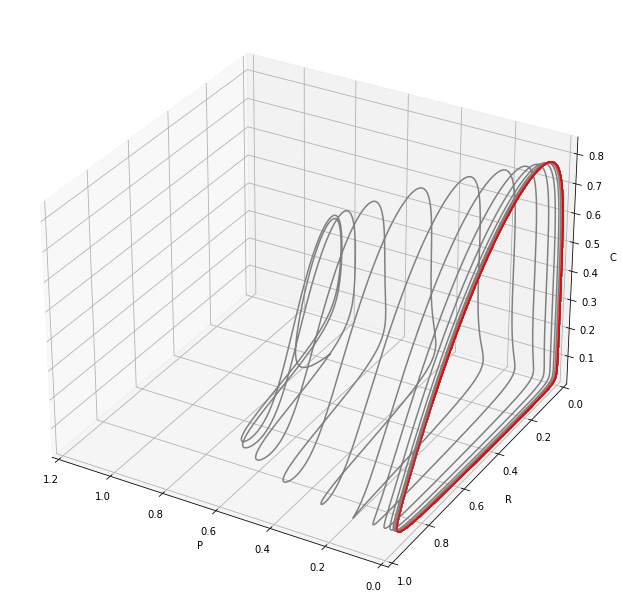

In [4]:
last = 500
dt = 0.1
T = 5500
t = np.arange(0, T, dt)
a0 = np.array([.5,0.25,.54])
fi = lambda x,t: pop_20_ode(x,t,K=0.99)
xi = odeint(fi, a0, t)
fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)

(1.0, 0.0)

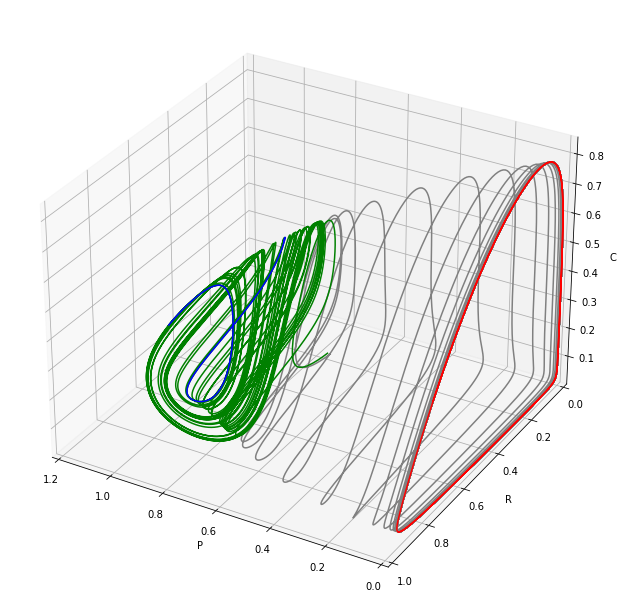

In [5]:
last = 500
pop_20_ode([1,1,1],0,K=1.0)
dt = 0.1
T = 1500
t = np.arange(0, T, dt)
a0 = np.array([.5,0.25,.55])
fi = lambda x,t: pop_20_ode(x,t,K=0.99)
xii = odeint(fi, a0, t)
fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
ax.plot3D(xii[:,2], xii[:,0], xii[:,1], 'green')
ax.plot3D(xii[-last:,2], xii[-last:,0], xii[-last:,1], 'blue')
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)

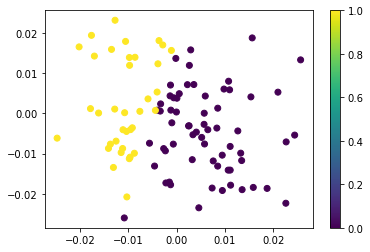

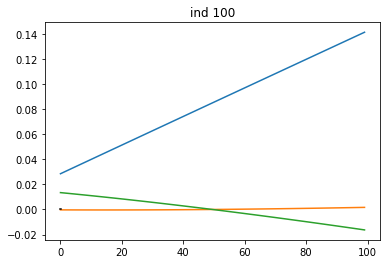

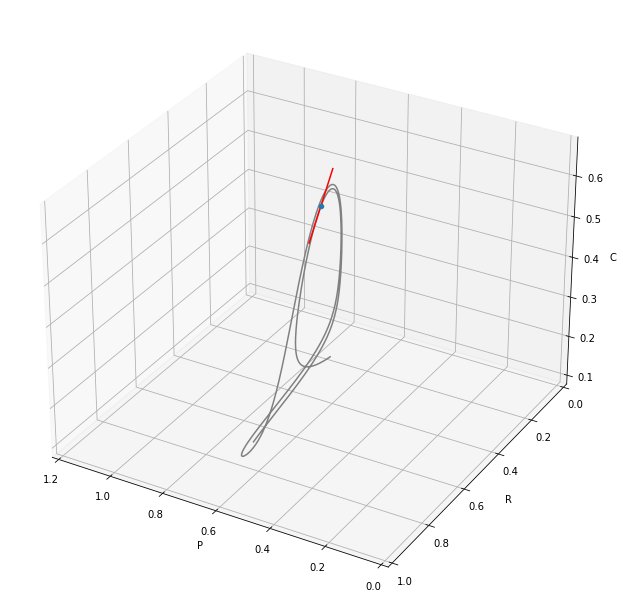

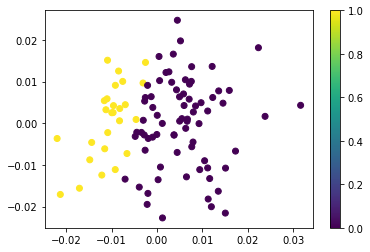

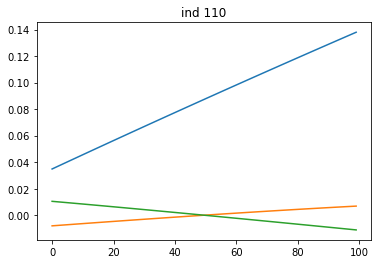

...

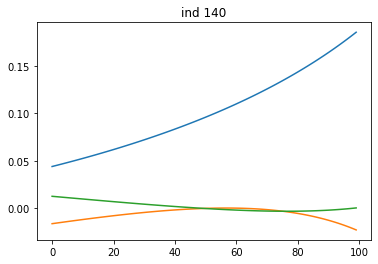

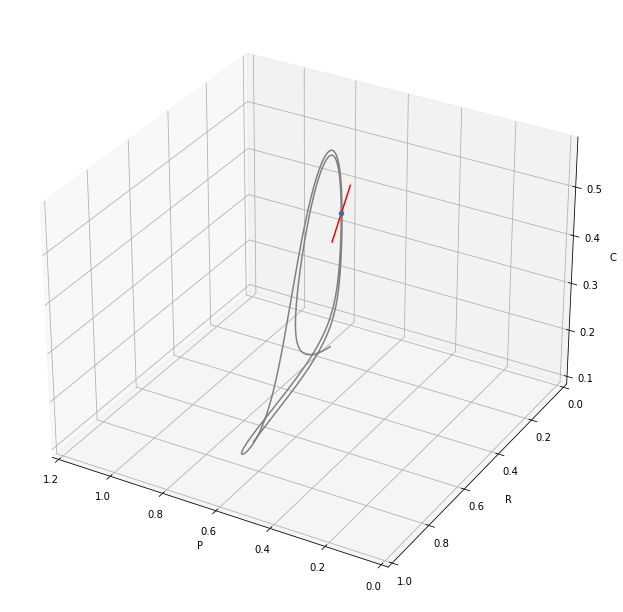

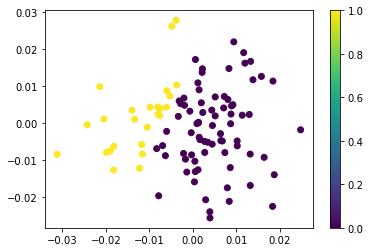

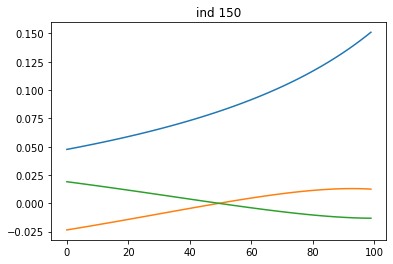

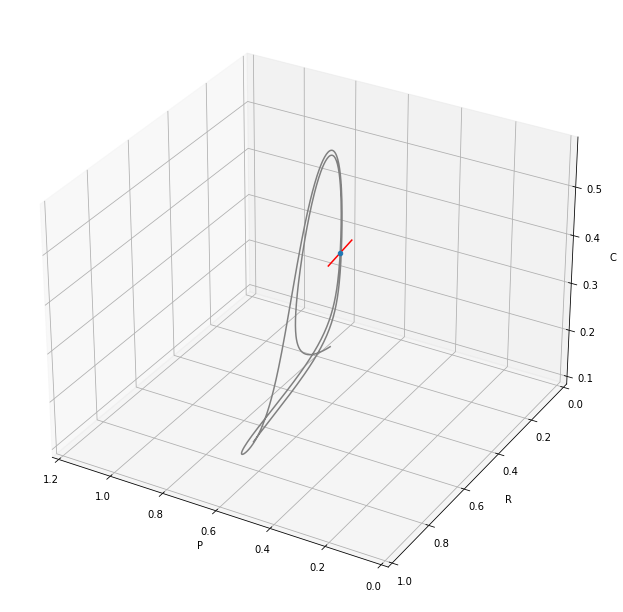

In [7]:
x0 = xi[:last]
num = 100
thr = .4
substeps = 1
t = np.arange(0, dt*last, dt)
spread = 0.01
f = lambda x: fi(x,0)
Jf = lambda x: Jpop_20_ode(x,0)
N=3
T = last
M = 76
def step(states):
    oldstates = np.copy(states)
    for j in range(substeps):
        states = rk_iter_nophi(dt,f,Jf,states)
    return states, np.mean(oldstates-states,axis=0)
def rk_iter_nophi(dt,f,Df,states):
    for i in range(len(states)):
        state = states[i]
        k1=dt*f(state)
        k2=dt*f(state+k1/2)
        k3=dt*f(state+k2/2)
        k4=dt*f(state+k3)
        states[i]=state+k1/6+k2/3+k3/3+k4/6
    return states
class rot_keeper(object):
    def __init__(self,d=3):
        assert(d>2)
        self.d=d
        self.e1 = np.zeros(d)
        self.e1[0]=1.0
        self.e1_sm = np.zeros(d-1)
        self.e1_sm[0]=1.0
        self.e2 = np.zeros(d)
        self.e2[1]=1.0
        self.R = np.eye(d)

    def get_rot(self,u):
        Rs = utils.rot_mat(u,self.e1)
        e2old = self.R.T@self.e2
        Rpp = np.eye(self.d)
        Rpp[1:,1:] = utils.rot_mat((Rs@e2old)[1:],self.e1_sm)
        Rs = Rpp @ Rs
        self.R = Rs
        return Rs


#initializing variables
X = xi[:last]
rotation_manager = rot_keeper(d=N)
allRots = np.zeros((T,N,N))
allG = np.zeros((T,N-1,N-1))
allOmega = np.zeros((T,N))
gstuff = np.zeros((T,N-1,M,M))
p = np.zeros((T,N,M,M))

#_, ds = step(X[i:i+1])
for ind in range(100,155,10):
    ds = f(X[ind])
    rot = rotation_manager.get_rot(ds)
    spr = np.zeros([N,num])
    spr[1:,:]=spread*np.random.randn(N-1,num)
    allX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,spr)
    colo = np.zeros(num)
    tt = np.arange(0, 500, dt)
    for i,testX in enumerate(allX.T):
        xt = odeint(fi, testX, tt)
        colo[i] = xt[-1,2]>thr

    plt.figure()
    plt.scatter(spr[1,:],spr[2,:],c=colo)
    plt.colorbar()
    plt.show()

    m1 = np.mean(spr[:,np.where(~(colo==1))],axis=2)
    m0 = np.mean(spr[:,np.where(colo==1)],axis=2)
    slope = (m0[2]-m1[2])/(m0[1]-m1[1])
    line = np.zeros([3,100])
    line[1,:] = np.linspace(-10*spread,10*spread,100)
    line[2,:] = slope*line[1,:]
    lineX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,line)
    lineg = np.apply_along_axis(f,0,lineX)
    lineg = np.einsum('ij,jk->ik',rot,lineg)
    theta = np.arctan(slope)[0]
    R = np.array([[1,0,0],
                  [0,np.cos(theta),-np.sin(theta)],
                  [0,np.sin(theta),np.cos(theta)]])
    lineg = np.einsum('ij,jk->ik',R,lineg)
    plt.figure()
    plt.title(f'ind {ind}')
    plt.plot(lineg.T)
    plt.plot(line[1,:],np.zeros_like(line[1,:]),'k-')
    plt.show()

    fig = plt.figure(figsize=[11,11])
    ax = plt.axes(projection='3d')
    ax.plot3D(X[:,2], X[:,0], X[:,1], 'gray')
    ax.scatter3D(X[ind,2], X[ind,0], X[ind,1])
    ax.plot3D(lineX[2,:], lineX[0,:], lineX[1,:], 'red')
    ax.set_xlabel('P')
    ax.set_ylabel('R')
    ax.set_zlabel('C')
    ax.set_xlim(1.2, 0)
    ax.set_ylim(1, 0)


<IPython.core.display.Javascript object>


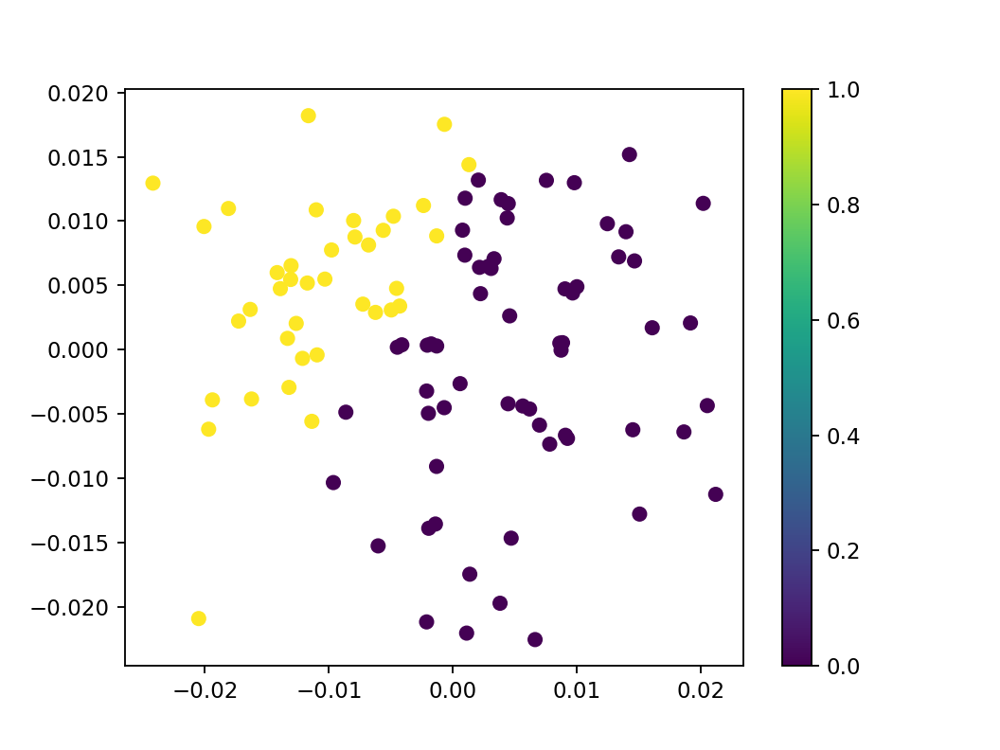

<IPython.core.display.Javascript object>


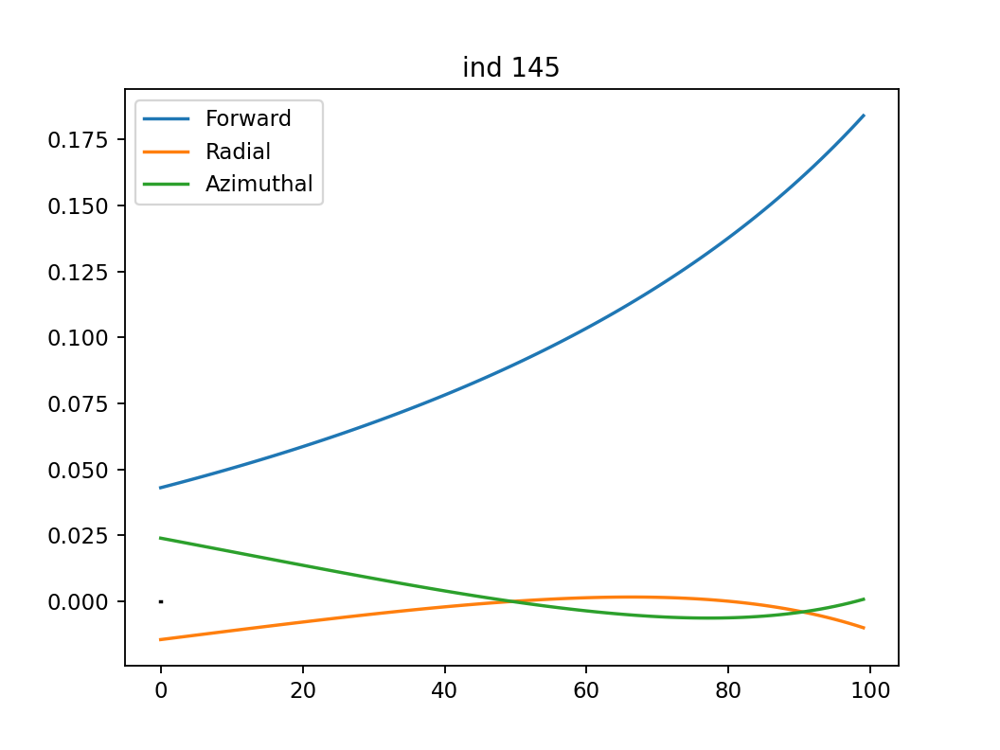

<IPython.core.display.Javascript object>


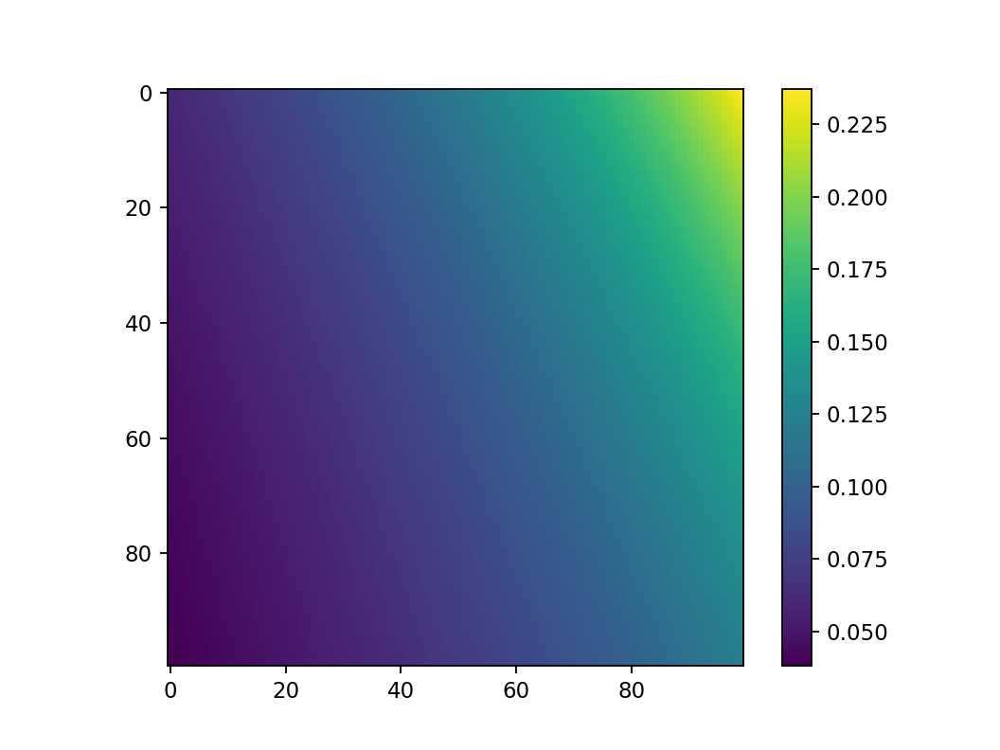

<IPython.core.display.Javascript object>


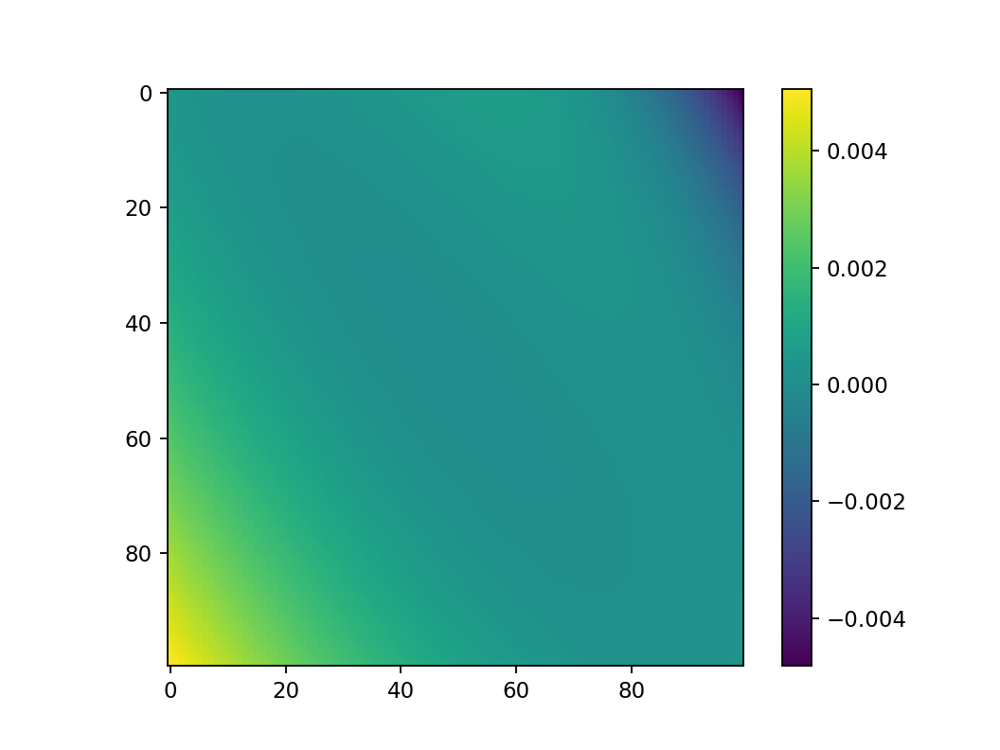

<IPython.core.display.Javascript object>


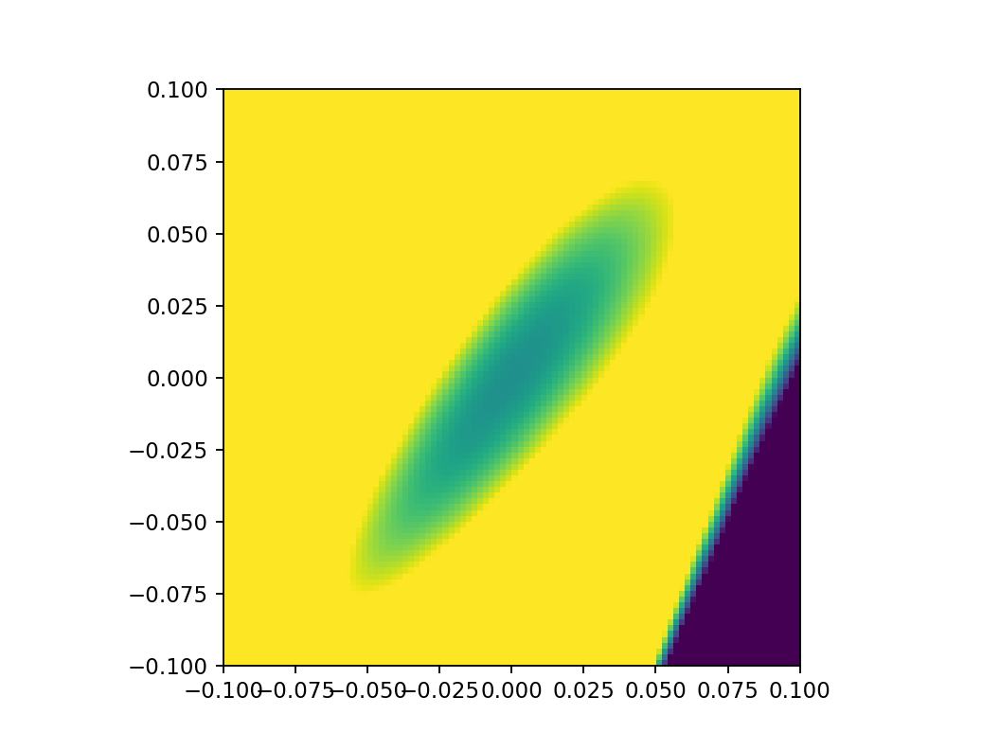

AttributeError: 'PathCollection' object has no property 'm'

In [6]:
ind=145
ffi = lambda x,t: pop_20_ode(x,t,K=.99)
ff = lambda x: ffi(x,0)
ds = ff(X[ind])
rot = rotation_manager.get_rot(ds)
spr = np.zeros([N,num])
spr[1:,:]=spread*np.random.randn(N-1,num)
allX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,spr)
colo = np.zeros(num)
tt = np.arange(0, 1000, dt)
for i,testX in enumerate(allX.T):
    xt = odeint(ffi, testX, tt)
    colo[i] = xt[-1,2]>thr

plt.figure()
plt.scatter(spr[1,:],spr[2,:],c=colo)
plt.colorbar()
plt.show()

m1 = np.mean(spr[:,np.where(~(colo==1))],axis=2)
m0 = np.mean(spr[:,np.where(colo==1)],axis=2)
slope = (m0[2]-m1[2])/(m0[1]-m1[1])
line = np.zeros([3,100])
line[1,:] = np.linspace(-10*spread,10*spread,100)
line[2,:] = slope*line[1,:]
lineX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,line)
lineg = np.apply_along_axis(ff,0,lineX)
lineg = np.einsum('ij,jk->ik',rot,lineg)
theta = np.arctan(slope)[0]
R = np.array([[1,0,0],
              [0,np.cos(theta),-np.sin(theta)],
              [0,np.sin(theta),np.cos(theta)]])
lineg = np.einsum('ij,jk->ik',R,lineg)
plt.figure()
plt.title(f'ind {ind}')
plt.plot(lineg.T)
plt.legend(['Forward','Radial','Azimuthal'])
plt.plot(line[1,:],np.zeros_like(line[1,:]),'k-')
plt.show()




px,py=np.meshgrid(np.linspace(-10*spread,10*spread,100),np.linspace(-10*spread,10*spread,100))
plane = np.stack([np.zeros_like(py.flatten()),px.flatten(),py.flatten()])
planeX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,plane)
planeg = np.apply_along_axis(ff,0,planeX)
planeg = np.einsum('ij,jk->ik',rot,planeg)
planeR = planeg[0:2,:]
planeR[1,:] = np.sum(plane[1:,:]*planeg[1:,:],axis=0)
pr = planeR.reshape((2,100,100))
plt.figure()
plt.imshow(pr[0])
plt.colorbar()
plt.show
plt.figure()
plt.imshow(pr[1])
plt.colorbar()
plt.show

plt.figure()
plt.imshow((pr[1]),origin="lower",vmin=-.0001,vmax=.0001,extent=[-10*spread,10*spread,-10*spread,10*spread])
plt.scatter(spr[1,np.where(colo)],spr[2,np.where(colo)],c='k',m='+')
plt.scatter(spr[1,np.where(~colo)],spr[2,np.where(~colo)],c='k',m='o')
plt.colorbar()
plt.show

fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(X[:,2], X[:,0], X[:,1], 'gray')
ax.scatter3D(X[ind,2], X[ind,0], X[ind,1])
ax.scatter3D(planeX[:,2], planeX[:,0], planeX[:,1], 'blue')
ax.plot3D(lineX[2,:], lineX[0,:], lineX[1,:], 'red')
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)


<IPython.core.display.Javascript object>


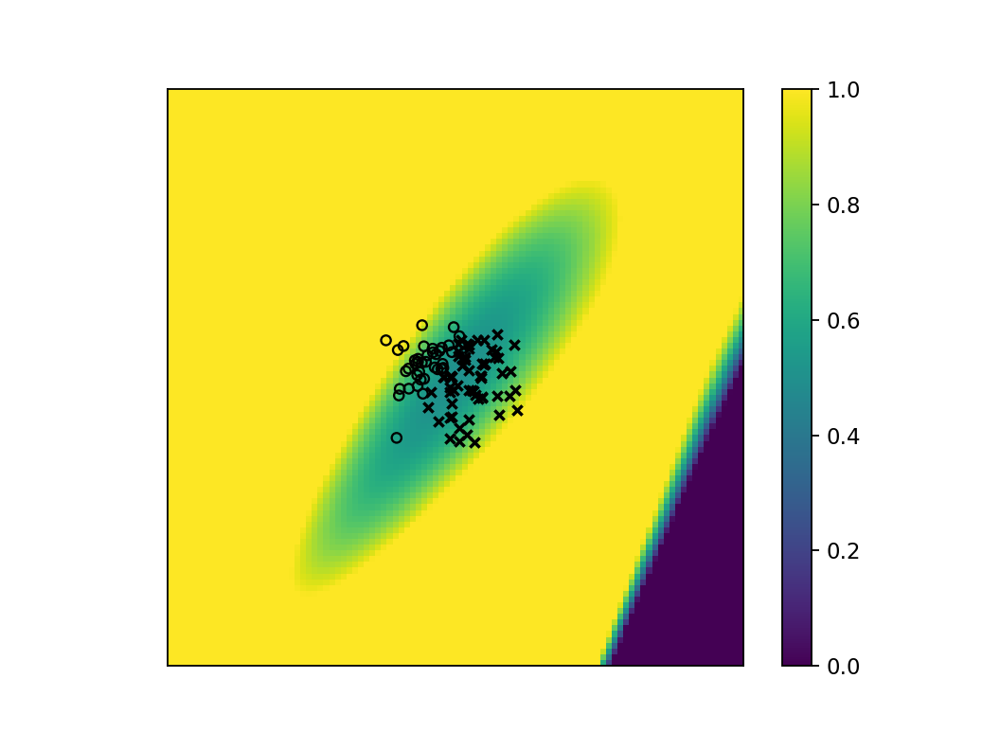

<function matplotlib.pyplot.show(block=None)>

In [7]:
plt.figure()
plt.imshow((pr[1]),origin="lower",vmin=-.0001,vmax=.0001,extent=[-10*spread,10*spread,-10*spread,10*spread])
plt.scatter(spr[1,np.where(colo)],spr[2,np.where(colo)],edgecolors='k',facecolors='none',marker='o',s=20)
plt.scatter(spr[1,np.where(np.abs(colo-1))],spr[2,np.where(np.abs(colo-1))],c='k',marker='x',s=20)
plt.colorbar()
plt.tick_params(left=False,
            bottom=False,
            labelleft=False,
            labelbottom=False)

plt.show


In [8]:
colo-1

array([-1., -1.,  0., -1., -1., -1., -1., -1.,  0., -1.,  0., -1., -1.,
        0., -1., -1.,  0., -1.,  0.,  0.,  0., -1.,  0., -1., -1., -1.,
       -1.,  0., -1., -1., -1., -1.,  0.,  0., -1.,  0., -1.,  0., -1.,
       -1., -1., -1.,  0.,  0.,  0., -1.,  0., -1.,  0.,  0., -1., -1.,
       -1., -1., -1.,  0.,  0., -1., -1.,  0., -1., -1., -1.,  0.,  0.,
        0., -1., -1., -1., -1., -1., -1.,  0., -1., -1., -1.,  0.,  0.,
       -1.,  0., -1.,  0., -1.,  0.,  0., -1., -1.,  0., -1.,  0., -1.,
        0.,  0., -1., -1., -1., -1.,  0., -1., -1.])

<IPython.core.display.Javascript object>


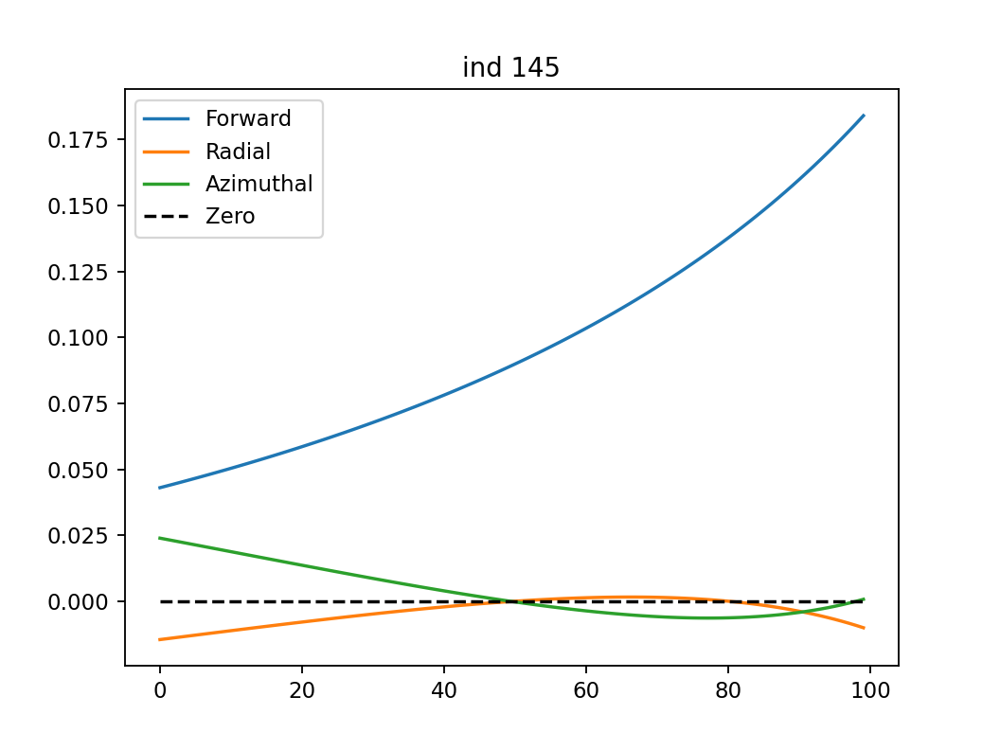

In [9]:
plt.figure()
plt.title(f'ind {ind}')
plt.plot(lineg.T)
plt.plot(range(0,lineg.shape[1]),np.zeros((lineg.shape[1],)),'k--')
plt.legend(['Forward','Radial','Azimuthal','Zero'])
plt.show()


In [37]:
planeX.reshape(3,100,100).shape

(3, 100, 100)

<IPython.core.display.Javascript object>


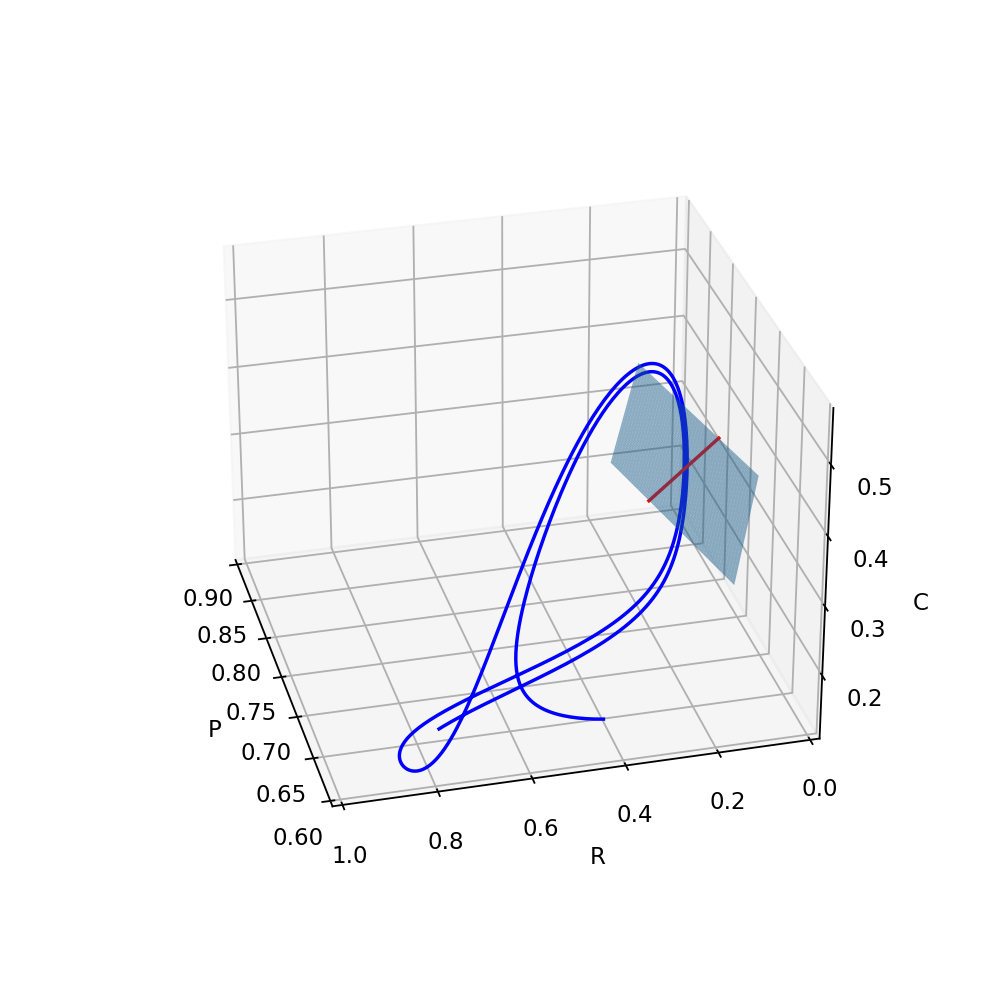

(1.0, 0.0)

In [42]:
fig = plt.figure(figsize=[6,6])
ax = plt.axes(projection='3d')
planerX = planeX.reshape(3,100,100)
ax.plot3D(X[:,2], X[:,0], X[:,1], 'blue')
#ax.scatter3D(X[ind,2], X[ind,0], X[ind,1])
#ax.scatter3D(planeX[2,::45], planeX[0,::45], planeX[1,::45], 'blue')
xp = np.linspace(np.min(X[:,2]), np.max(X[:,2]), 100)
yp = np.linspace(np.min(X[:,0]), np.max(X[:,0]), 100)
xp, yp = np.meshgrid(xp, yp)
ax.plot_surface(planerX[2],planerX[0],planerX[1],alpha=.5)
ax.plot3D(lineX[2,:], lineX[0,:], lineX[1,:], 'red')
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(0.9, .6)
ax.set_ylim(1, 0)

<IPython.core.display.Javascript object>


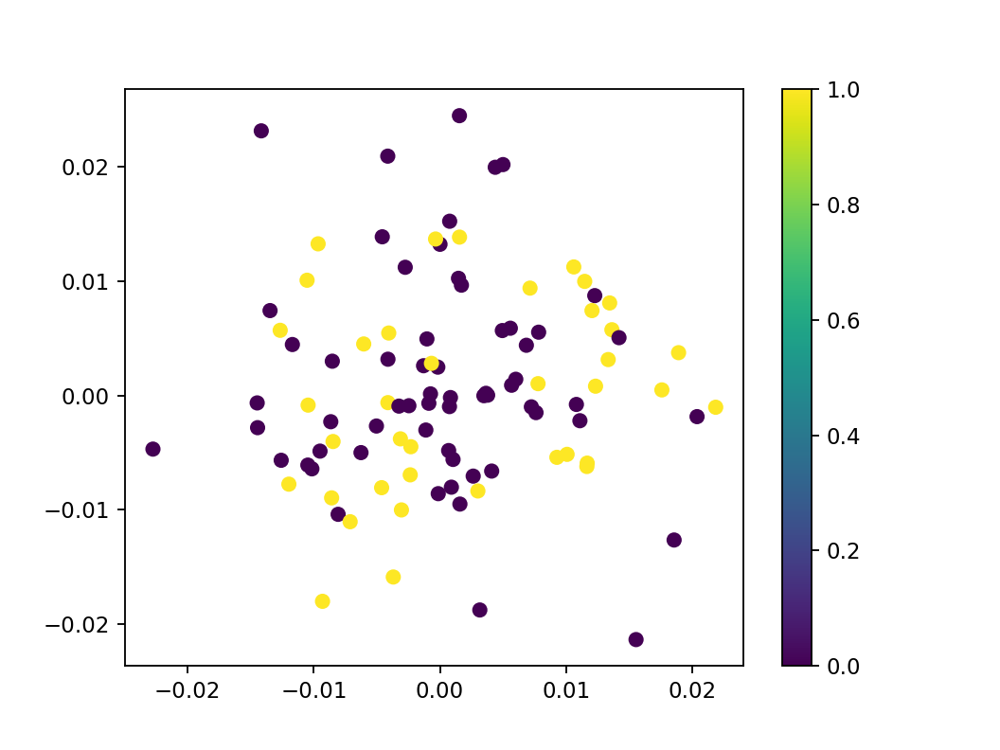

<IPython.core.display.Javascript object>


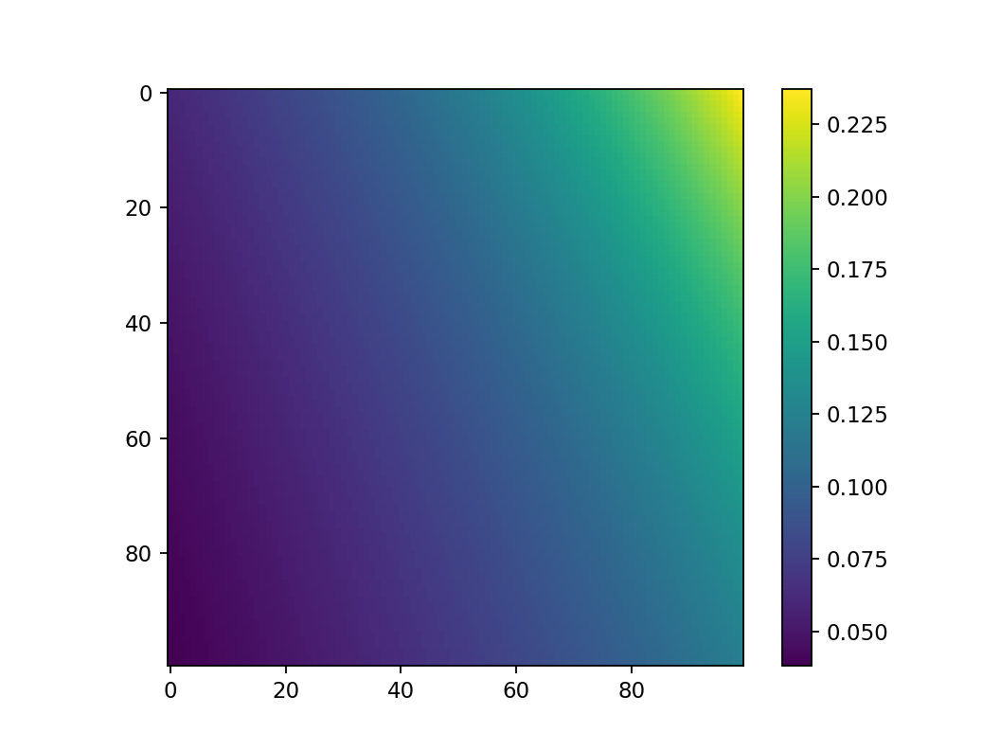

<IPython.core.display.Javascript object>


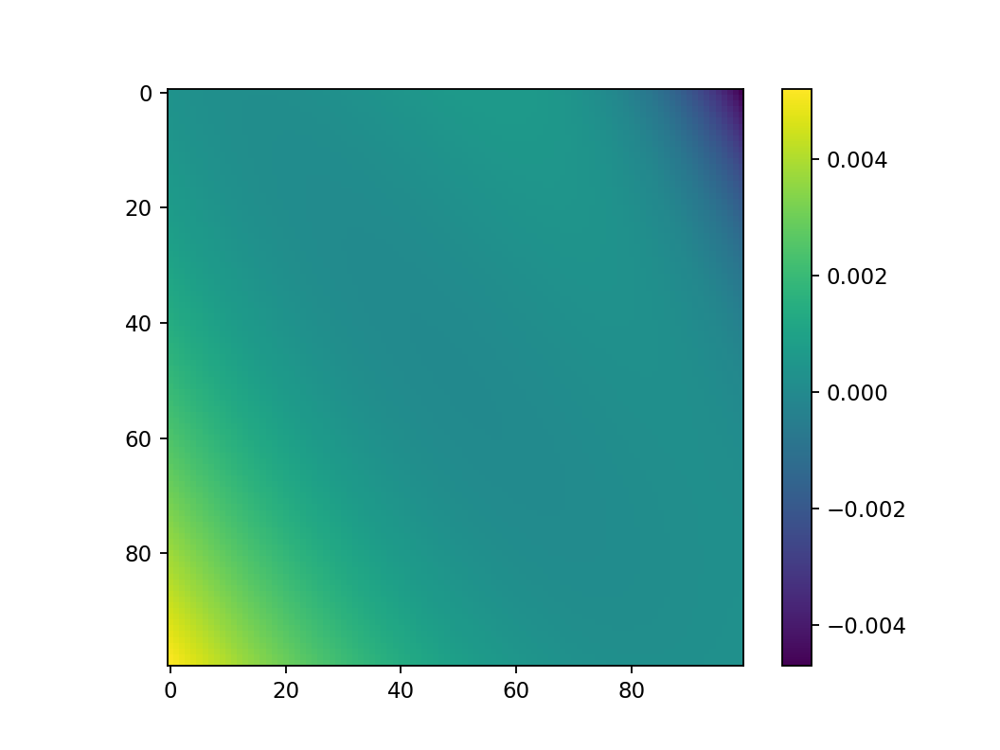

<IPython.core.display.Javascript object>


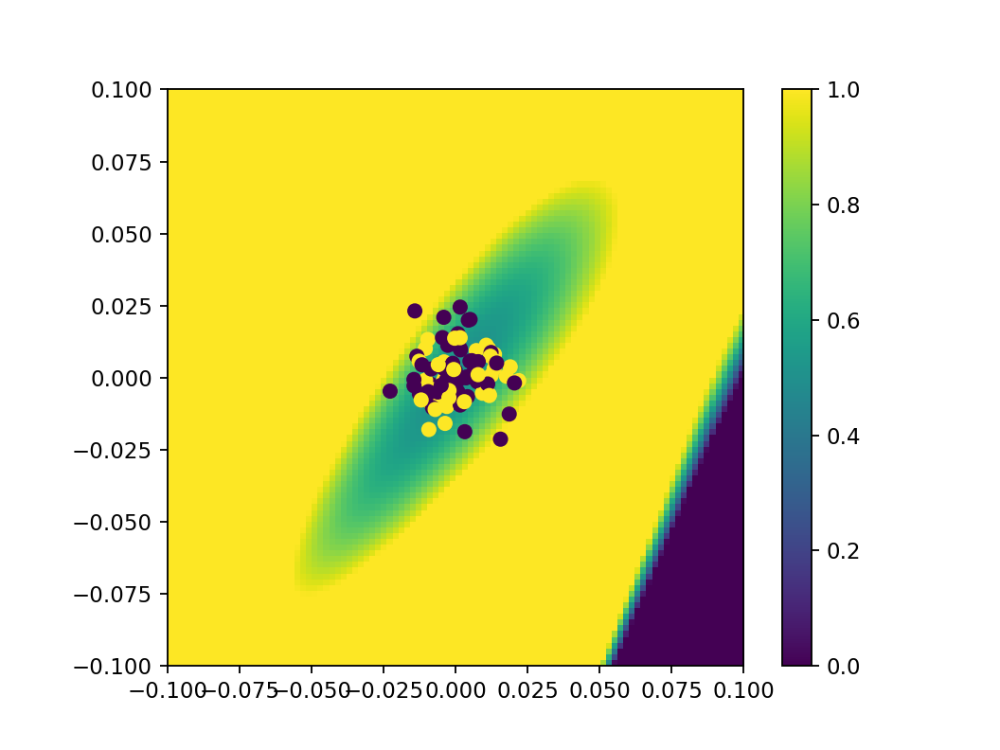

C:\Users\water\AppData\Local\Temp/ipykernel_11544/295601821.py:79: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<IPython.core.display.Javascript object>


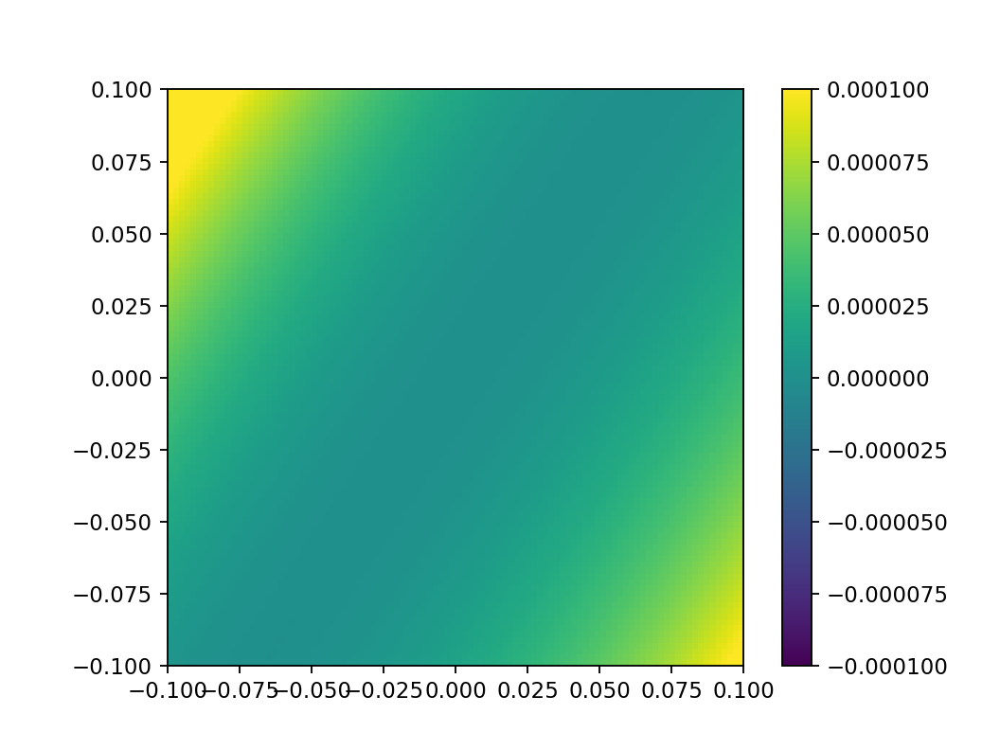

<function matplotlib.pyplot.show(block=None)>

In [11]:
ind=145
ffi = lambda x,t: pop_20_ode(x,t,K=1.01)
ff = lambda x: ffi(x,0)
ds = ff(X[ind])
rot = rotation_manager.get_rot(ds)
qspr = np.zeros([N,num])
qspr[1:,:]=spread*np.random.randn(N-1,num)
qallX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,qspr)
qcolo = np.zeros(num)
tt = np.arange(0, 1000, dt)
for i,testX in enumerate(qallX.T):
    xt = odeint(ffi, testX, tt)
    qcolo[i] = xt[-1,2]>thr

plt.figure()
plt.scatter(qspr[1,:],qspr[2,:],c=colo)
plt.colorbar()
plt.show()

"""
m1 = np.mean(spr[:,np.where(~(colo==1))],axis=2)
m0 = np.mean(spr[:,np.where(colo==1)],axis=2)
slope = (m0[2]-m1[2])/(m0[1]-m1[1])
line = np.zeros([3,100])
line[1,:] = np.linspace(-10*spread,10*spread,100)
line[2,:] = slope*line[1,:]
lineX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,line)
lineg = np.apply_along_axis(ff,0,lineX)
lineg = np.einsum('ij,jk->ik',rot,lineg)
theta = np.arctan(slope)[0]
R = np.array([[1,0,0],
              [0,np.cos(theta),-np.sin(theta)],
              [0,np.sin(theta),np.cos(theta)]])
lineg = np.einsum('ij,jk->ik',R,lineg)
plt.figure()
plt.title(f'ind {ind}')
plt.plot(lineg.T)
plt.plot(line[1,:],np.zeros_like(line[1,:]),'k-')
plt.show()


fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(X[:,2], X[:,0], X[:,1], 'gray')
ax.scatter3D(X[ind,2], X[ind,0], X[ind,1])
ax.plot3D(lineX[2,:], lineX[0,:], lineX[1,:], 'red')
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)
"""

px,py=np.meshgrid(np.linspace(-10*spread,10*spread,100),np.linspace(-10*spread,10*spread,100))
plane = np.stack([np.zeros_like(py.flatten()),px.flatten(),py.flatten()])
planeX = np.expand_dims(X[ind],axis=1)+np.einsum('ij,jk->ik',rot.T,plane)
planeg = np.apply_along_axis(ff,0,planeX)
planeg = np.einsum('ij,jk->ik',rot,planeg)
planeR = planeg[0:2,:]
planeR[1,:] = np.sum(plane[1:,:]*planeg[1:,:],axis=0)
qpr = planeR.reshape((2,100,100))
plt.figure()
plt.imshow(qpr[0])
plt.colorbar()
plt.show
plt.figure()
plt.imshow(qpr[1])
plt.colorbar()
plt.show


plt.figure()
plt.imshow((qpr[1]),origin="lower",vmin=-.0001,vmax=.0001,extent=[-10*spread,10*spread,-10*spread,10*spread])
plt.scatter(qspr[1,:],qspr[2,:],c=colo)
plt.colorbar()
plt.show


plt.figure()
plt.imshow((qpr[1]-pr[1]),origin="lower",vmin=-.0001,vmax=.0001,extent=[-10*spread,10*spread,-10*spread,10*spread])
plt.colorbar()
plt.show


In [12]:
10

10

<IPython.core.display.Javascript object>


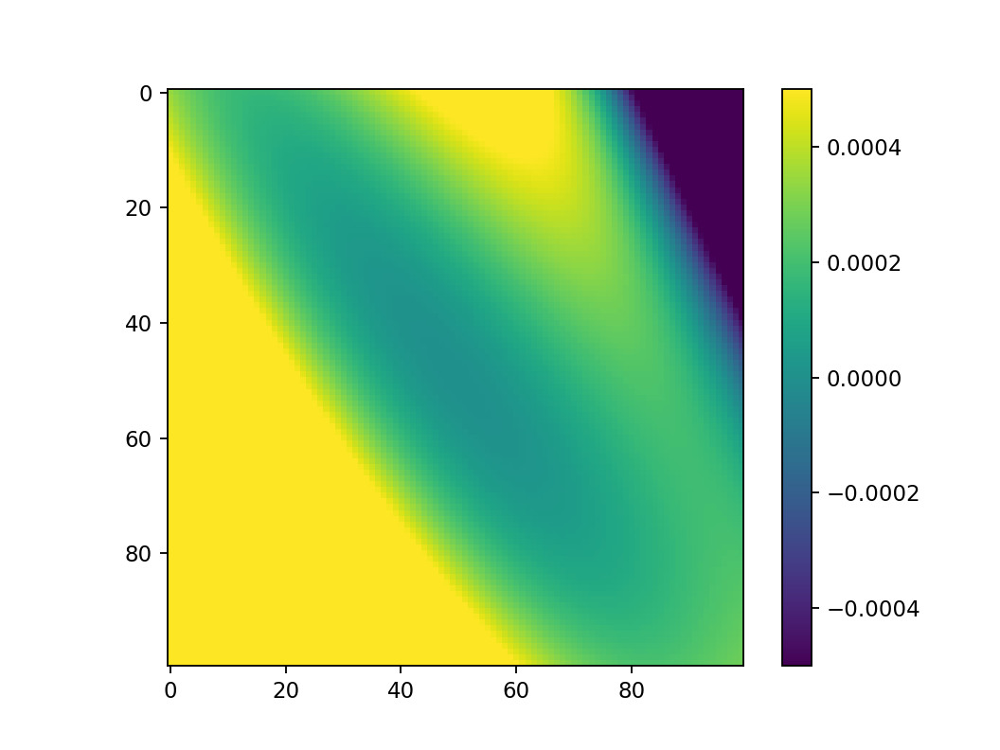

<function matplotlib.pyplot.show(block=None)>

In [13]:
plt.figure()
plt.imshow(pr[1],vmin=-.0005,vmax=.0005)
plt.colorbar()
plt.show


<IPython.core.display.Javascript object>


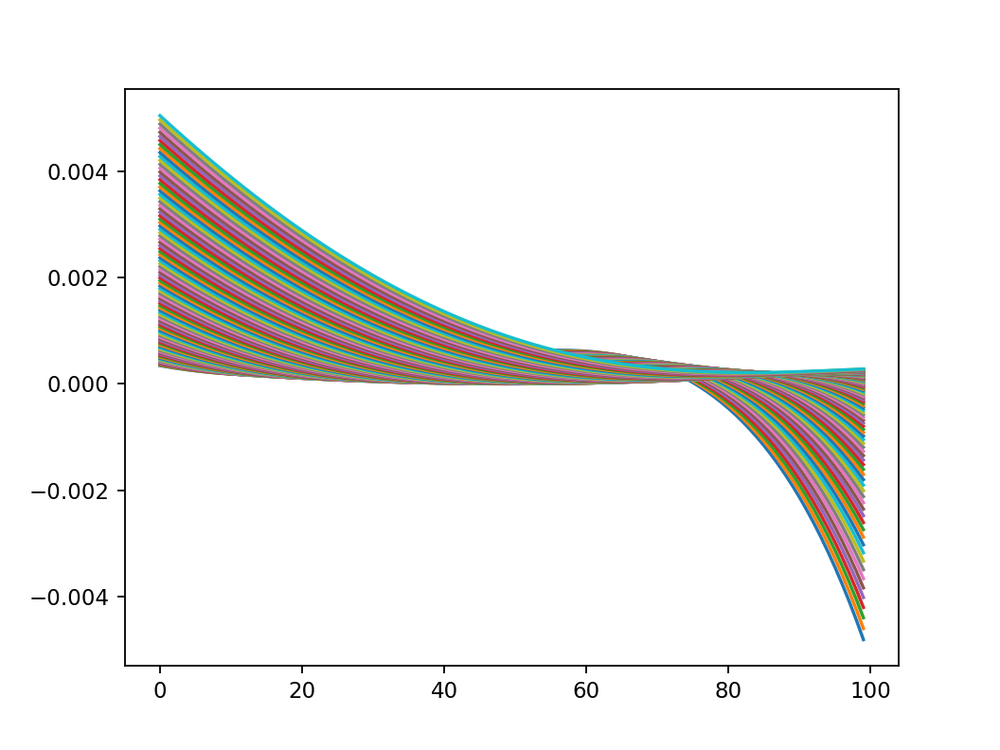

<function matplotlib.pyplot.show(block=None)>

In [35]:
plt.figure()
plt.plot(pr[1].T)
plt.show


<IPython.core.display.Javascript object>


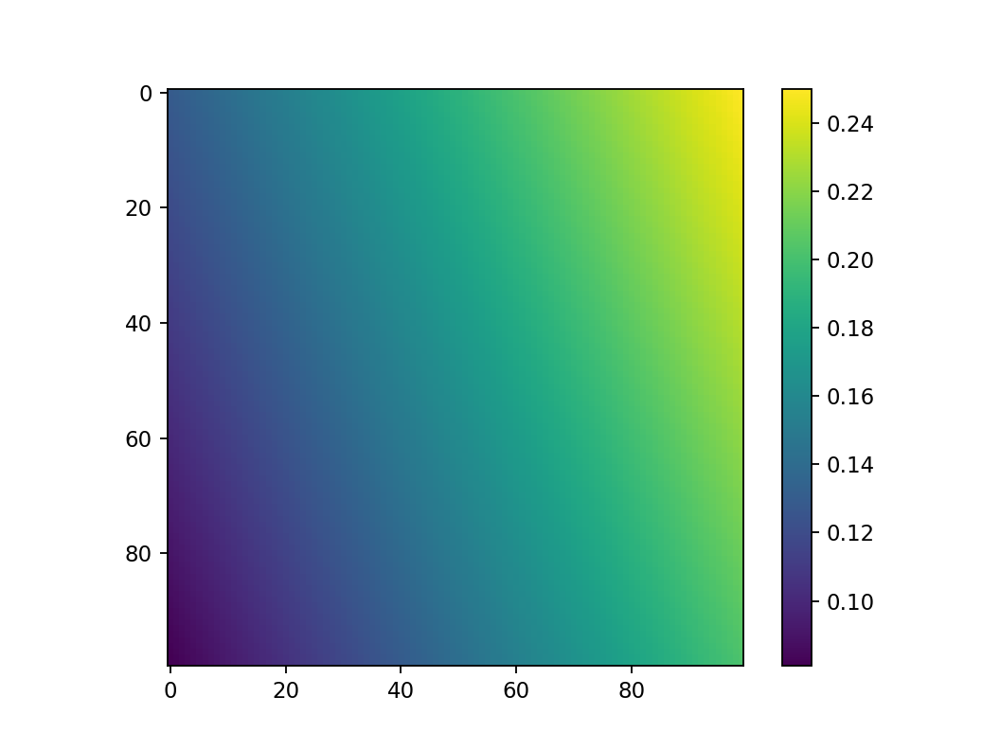

<IPython.core.display.Javascript object>


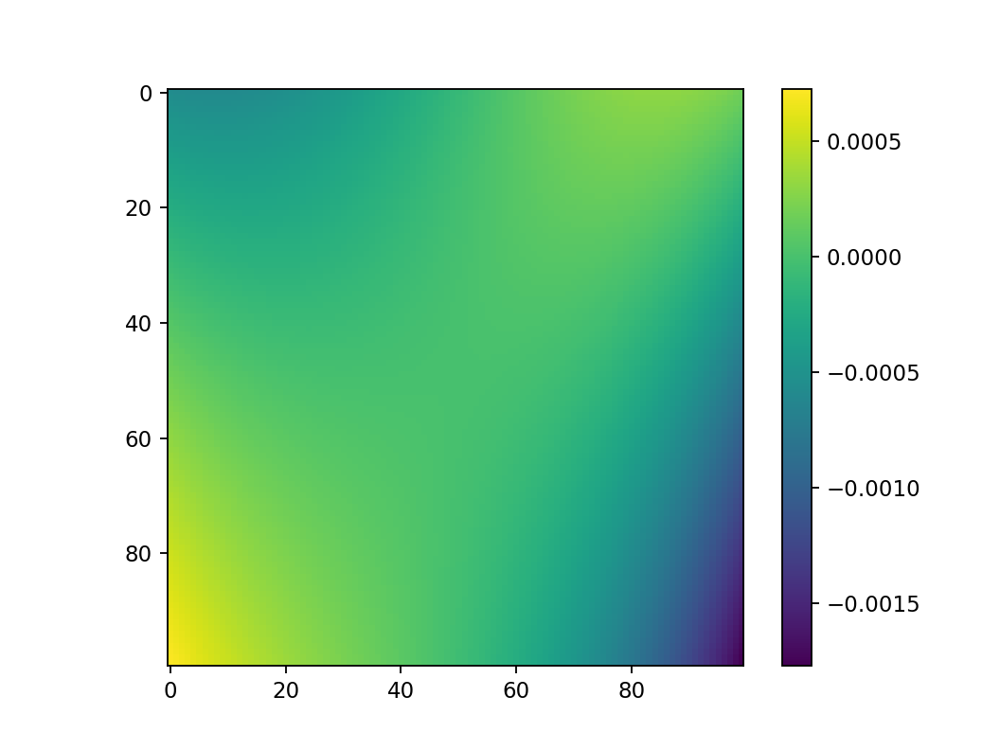

<function matplotlib.pyplot.show(block=None)>

In [11]:
def cart2pol(x, y):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return(rho, phi)


In [1]:
np.arctan2

NameError: name 'm' is not defined

In [30]:
n = 75//2+20
plt.figure()
plt.plot(np.arange(MB,ME),gstuff[i][0,:,n])
plt.plot(np.arange(MB,ME),gstuff[i][1,:,n])
plt.show()


<function matplotlib.pyplot.scatter(x, y, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None, *, edgecolors=None, plotnonfinite=False, data=None, **kwargs)>

<IPython.core.display.Javascript object>


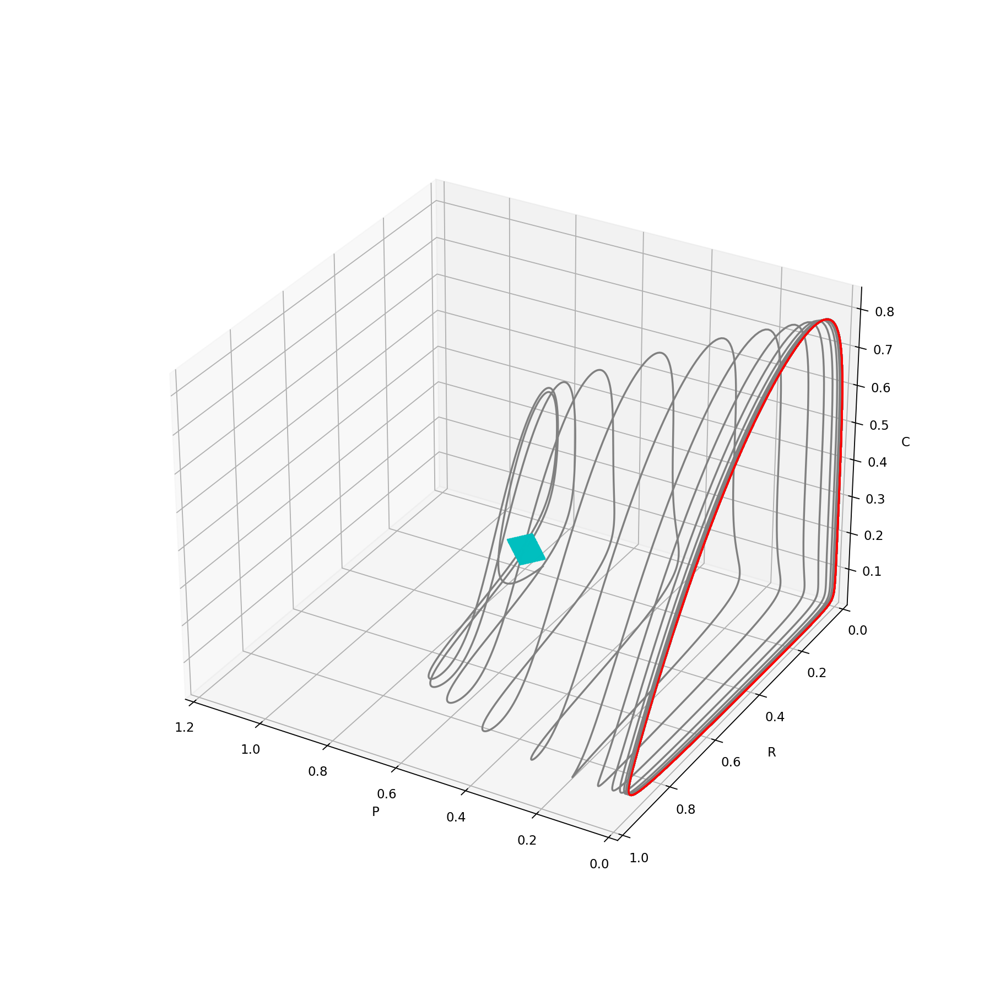

<IPython.core.display.Javascript object>


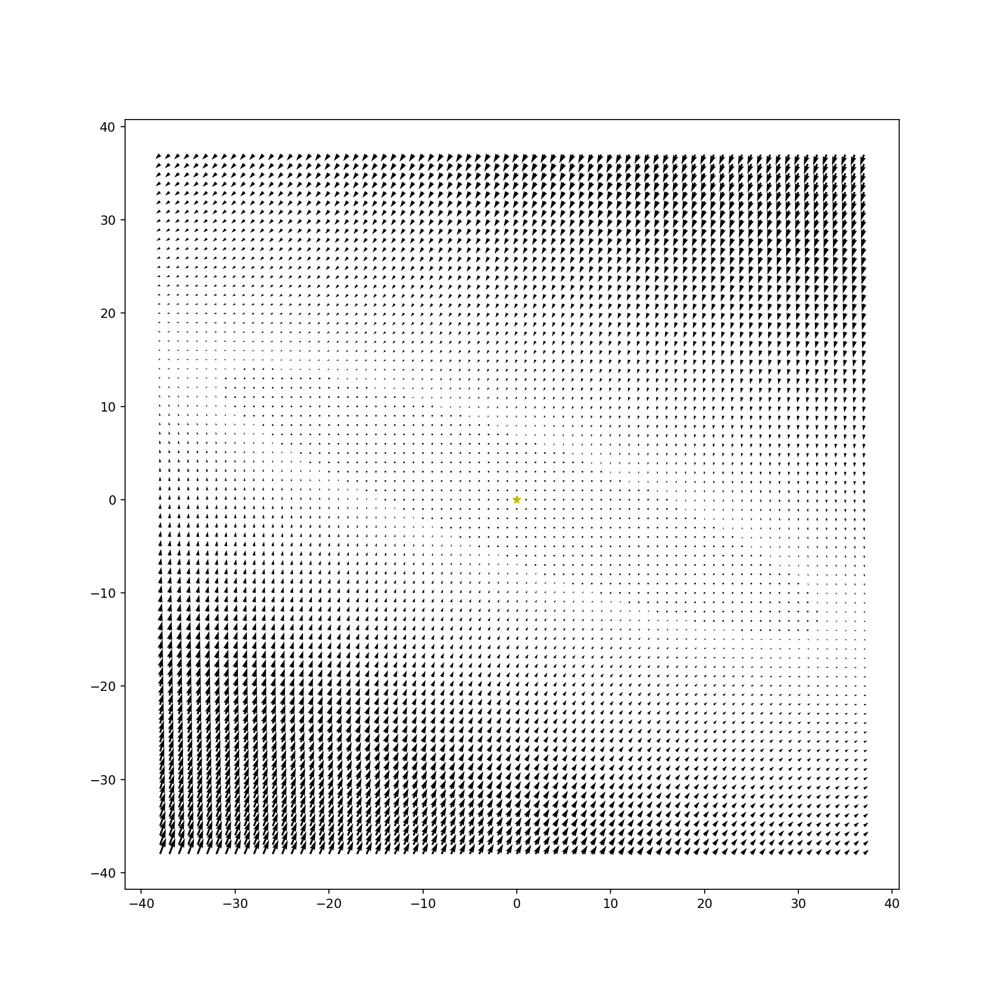

In [7]:
i = 470
fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
ax.plot3D(X[i,2], X[i,0], X[i,1], 'y*')
ax.plot3D(p[i,2].flatten(), p[i,0].flatten(), p[i,1].flatten(), 'c.',ms=1)
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)
fig = plt.figure(figsize=[11,11])
MB,ME = -M//2,M//2
plt.quiver(np.arange(MB,ME),np.arange(MB,ME),gstuff[i][0],gstuff[i][1])
plt.plot(0,0,'y*')
plt.show()

<IPython.core.display.Javascript object>


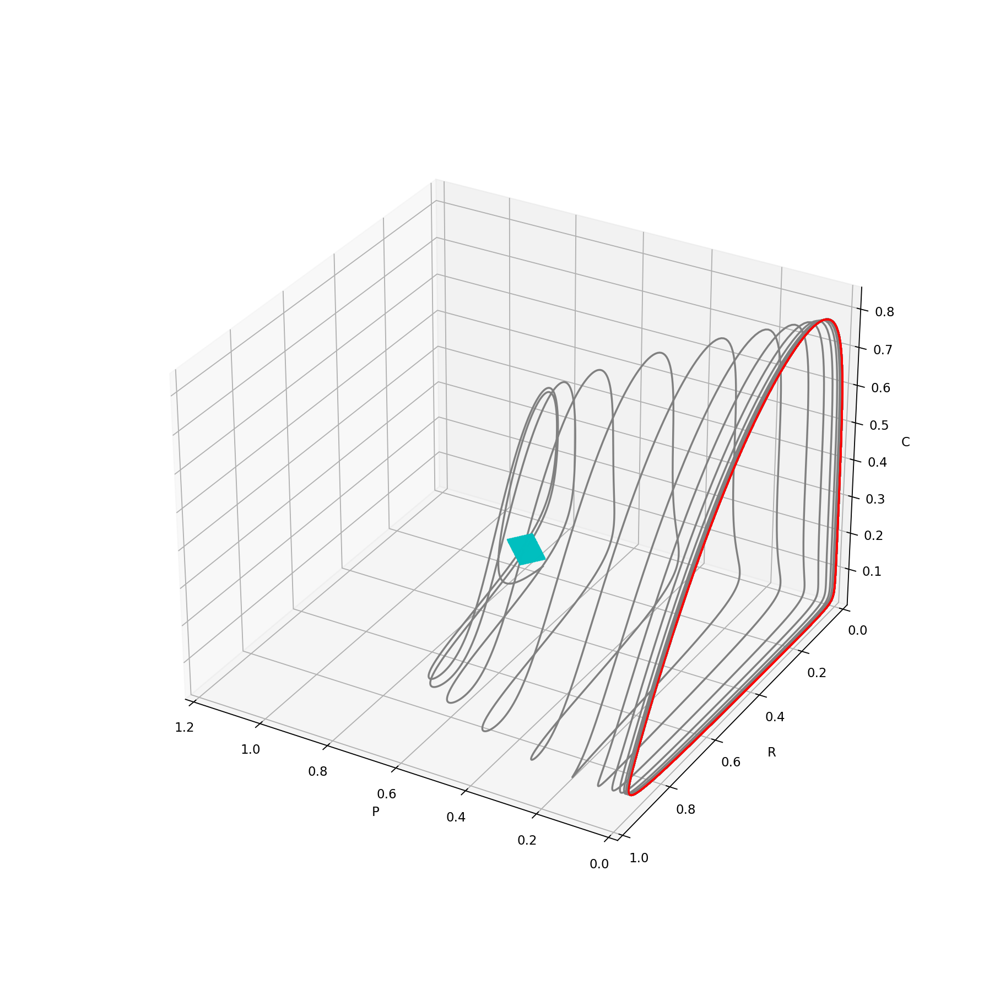

<IPython.core.display.Javascript object>


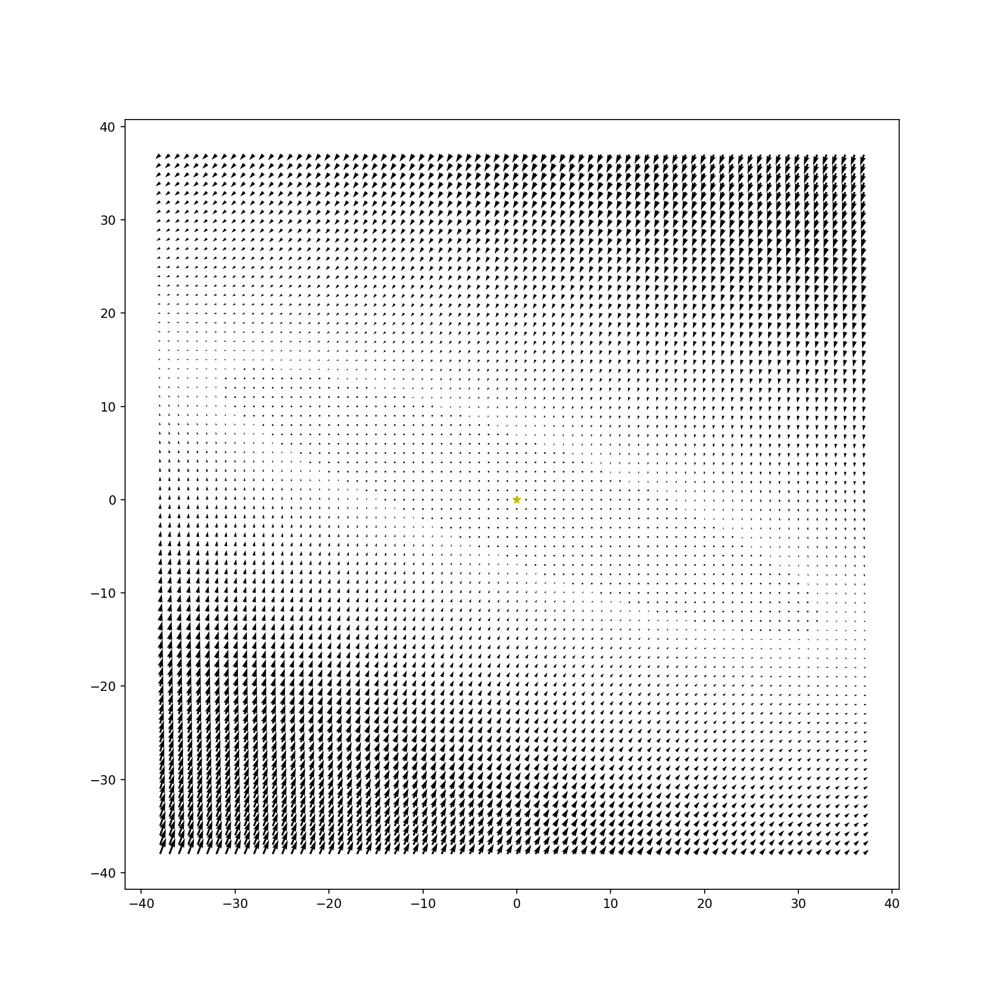

In [8]:
i = 470
fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
ax.plot3D(X[i,2], X[i,0], X[i,1], 'y*')
ax.plot3D(p[i,2].flatten(), p[i,0].flatten(), p[i,1].flatten(), 'c.',ms=1)
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)
fig = plt.figure(figsize=[11,11])
MB,ME = -M//2,M//2
plt.quiver(np.arange(MB,ME),np.arange(MB,ME),gstuff[i][0],gstuff[i][1])
plt.plot(0,0,'y*')
plt.show()

<IPython.core.display.Javascript object>


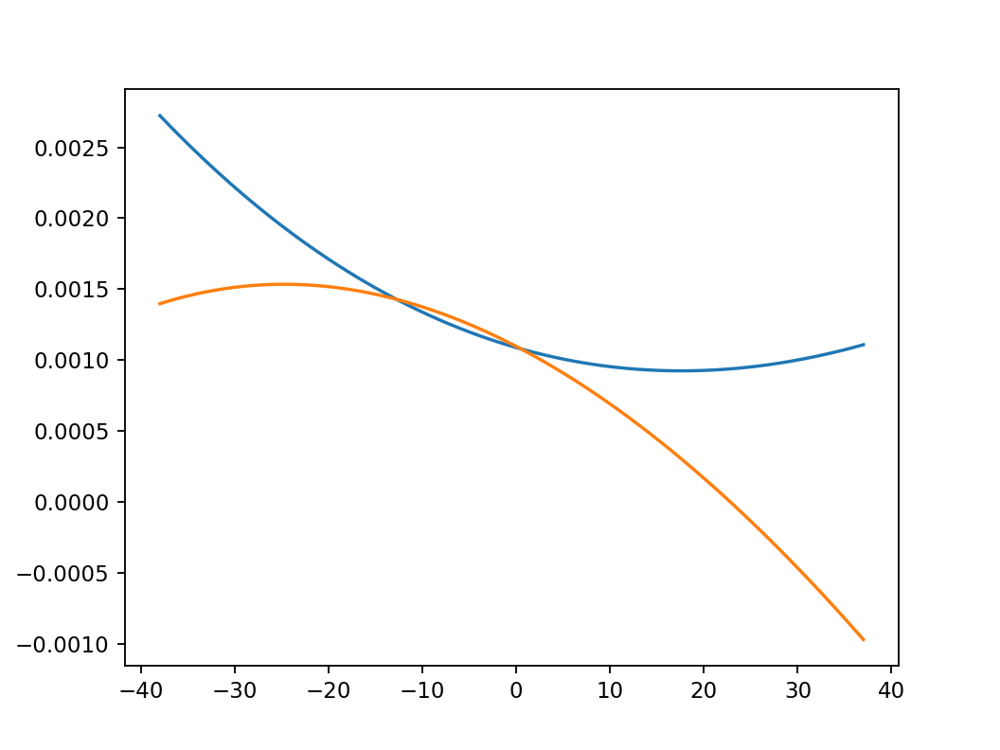

In [204]:
n = 75//2+20
plt.figure()
plt.plot(np.arange(MB,ME),gstuff[i][0,:,n])
plt.plot(np.arange(MB,ME),gstuff[i][1,:,n])
plt.show()


<IPython.core.display.Javascript object>


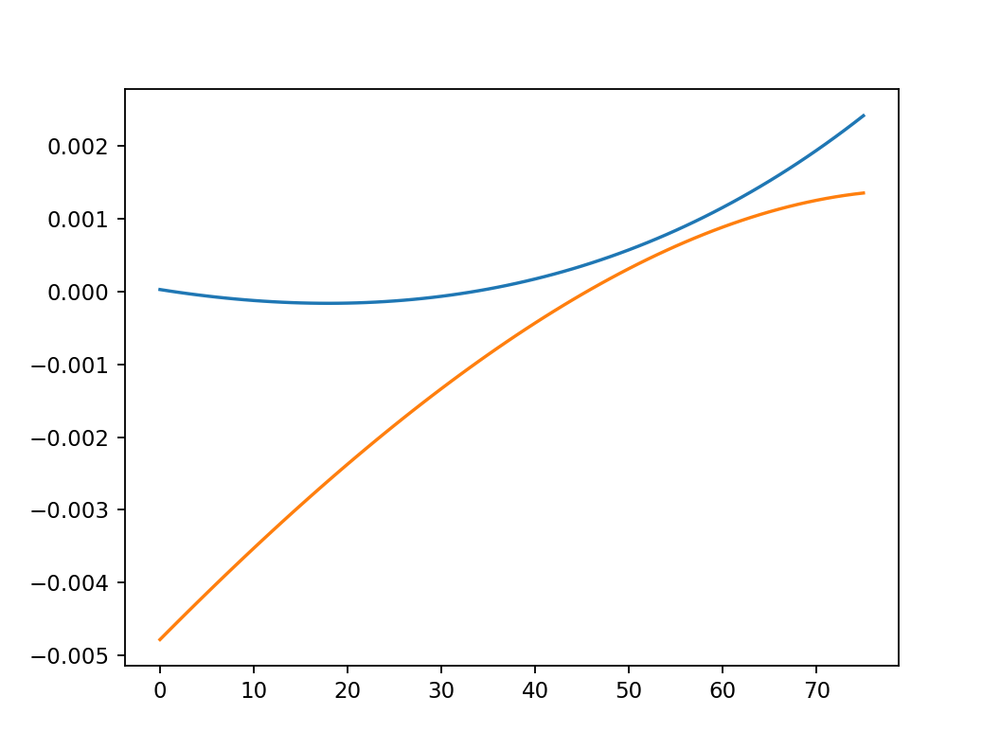

In [208]:
n = 75//2+10;
plt.figure()
plt.plot(gstuff[i][0,n,:])
plt.plot(gstuff[i][1,n,:])
plt.show()

In [89]:
filt = np.zeros((3,3))
filt[:,2] = np.cos(np.pi/4)
filt[1,2] = 1
filt[:,0] = -np.cos(np.pi/4)
filt[1,0] = -1
filt[1,1] = 0
fx,fy = np.meshgrid(range(0,3),range(0,3))
filt = np.stack([filt,-np.rot90(filt)],axis=2)
if False:
    plt.figure()
    plt.quiver(fx,fy,filt[:,:,0],filt[:,:,1])
    plt.show()


<IPython.core.display.Javascript object>


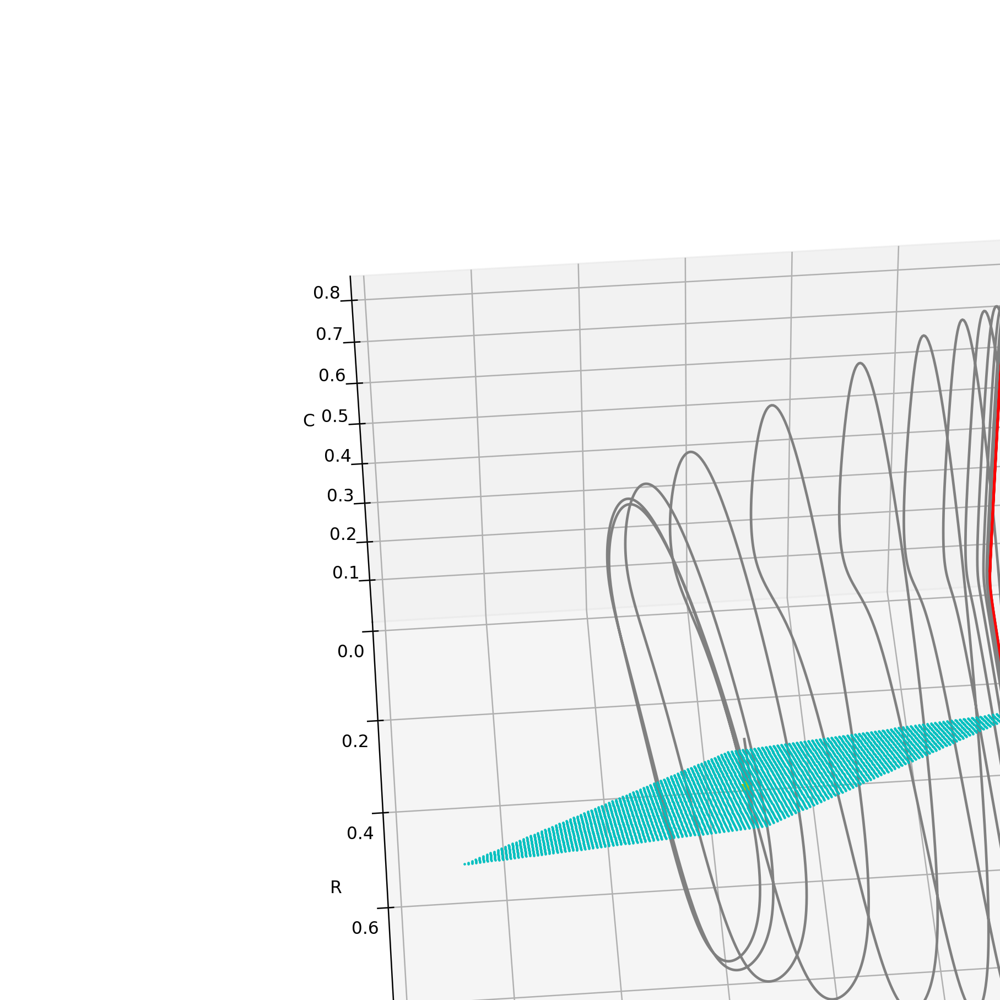

<IPython.core.display.Javascript object>


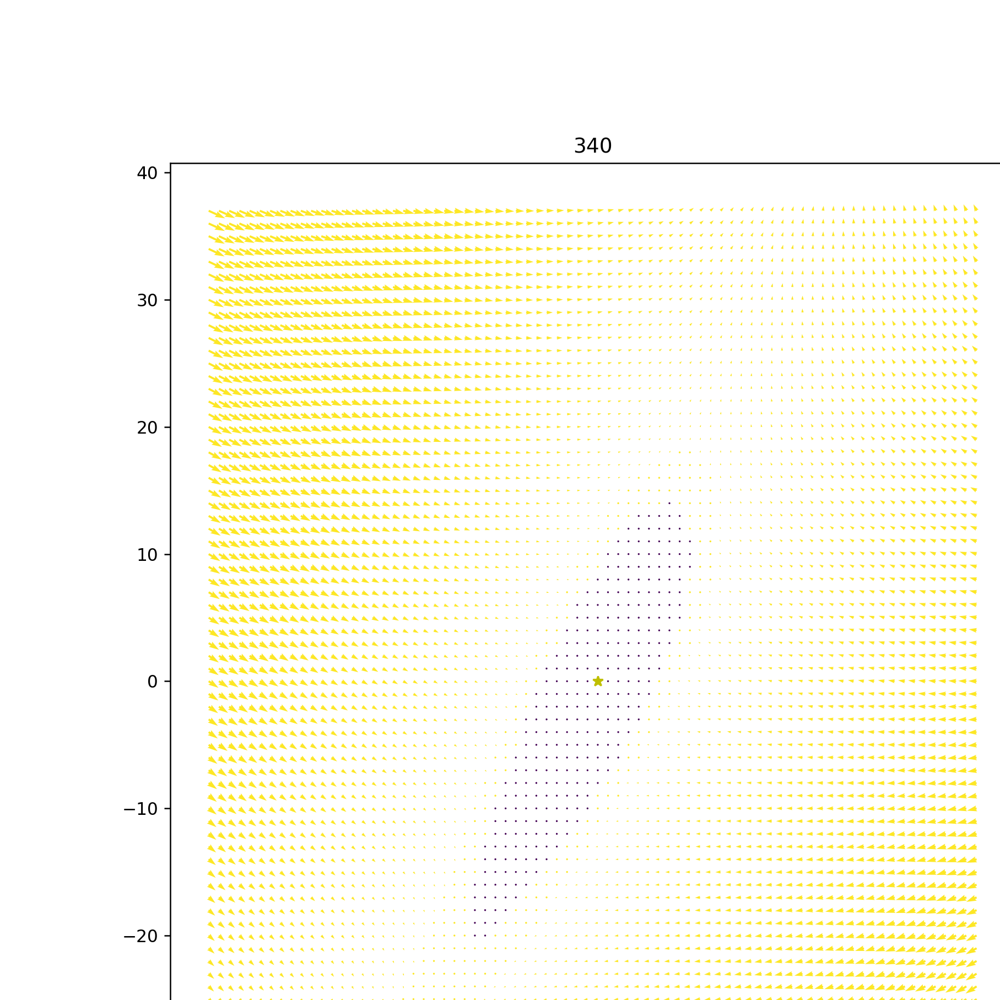

In [112]:
thr = 0.01
for i in range(340,390,200):
    context = True
    diff = False
    laplace = False
    Ki = .1
    fi = lambda x: pop_20_ode(x,0,K=Ki)
    dsi = fi(X[i])
    allRotsi = rotation_manager.get_rot(dsi)
    pi = perp_plane(X[i],allRotsi,delta = 0.01,N=M)
    g_in_fi = np.apply_along_axis(fi,0,pi)
    gstuffi = np.einsum('ij,jkl->ikl',allRotsi,g_in_fi)[1:]
    if context:
        fig = plt.figure(figsize=[11,11])
        ax = plt.axes(projection='3d')
        ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
        ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
        ax.plot3D(X[i,2], X[i,0], X[i,1], 'y*')
        ax.plot3D(p[i,2].flatten(), p[i,0].flatten(), p[i,1].flatten(), 'c.',ms=1)
        ax.set_xlabel('P')
        ax.set_ylabel('R')
        ax.set_zlabel('C')
        ax.set_xlim(1.2, 0)
        ax.set_ylim(1, 0)
    fig = plt.figure(figsize=[11,11])
    if laplace:
        colod = np.sqrt(gstuffi[0]**2 + gstuffi[1]**2)<thr
        colo=conv2(gstuffi[1],filt[:,:,1],'valid')
        colo+=conv2(gstuffi[0],filt[:,:,0],'valid')
        colo*=colod[1:-1,1:-1]
        MB,ME = -M//2+1,M//2-1
        plt.quiver(np.arange(MB,ME),np.arange(MB,ME),gstuffi[0][1:-1,1:-1],
                   gstuffi[1][1:-1,1:-1],colo)
        #plt.quiver(np.arange(-M//4,M//4),np.arange(-M//4,M//4),gstuffi[0][M//4:-M//4,M//4:-M//4],
        #           gstuffi[1][M//4:-M//4,M//4:-M//4],colo[M//4-1:-M//4+1,M//4-1:-M//4+1])
        plt.colorbar()        
    elif diff:
        colo = np.log(np.sqrt((gstuffi[0]-gstuff[i][0])**2 + (gstuffi[1]-gstuff[i][1])**2) )
        plt.imshow(colo)
        plt.colorbar()
    else:
        colo = np.sqrt(gstuffi[0]**2 + gstuffi[1]**2) > thr
        MB,ME = -M//2,M//2
        plt.quiver(np.arange(MB,ME),np.arange(MB,ME),gstuffi[0],
                   gstuffi[1],colo)
        #colo = colo[M//4:-M//4,M//4:-M//4]
        #plt.quiver(np.arange(-M//4,M//4),np.arange(-M//4,M//4),
        #           np.sign(gstuffi[0][M//4:-M//4,M//4:-M//4])*np.log(np.abs(gstuffi[0][M//4:-M//4,M//4:-M//4])),
        #           np.sign(gstuffi[1][M//4:-M//4,M//4:-M//4])*np.log(np.abs(gstuffi[1][M//4:-M//4,M//4:-M//4])),colo)
        plt.colorbar()
        #plt.quiver(gstuffi[0][15:35,15:35],gstuffi[1][15:35,15:35])
    plt.plot(0,0,'y*')
    plt.title(i)
    plt.show()

<IPython.core.display.Javascript object>


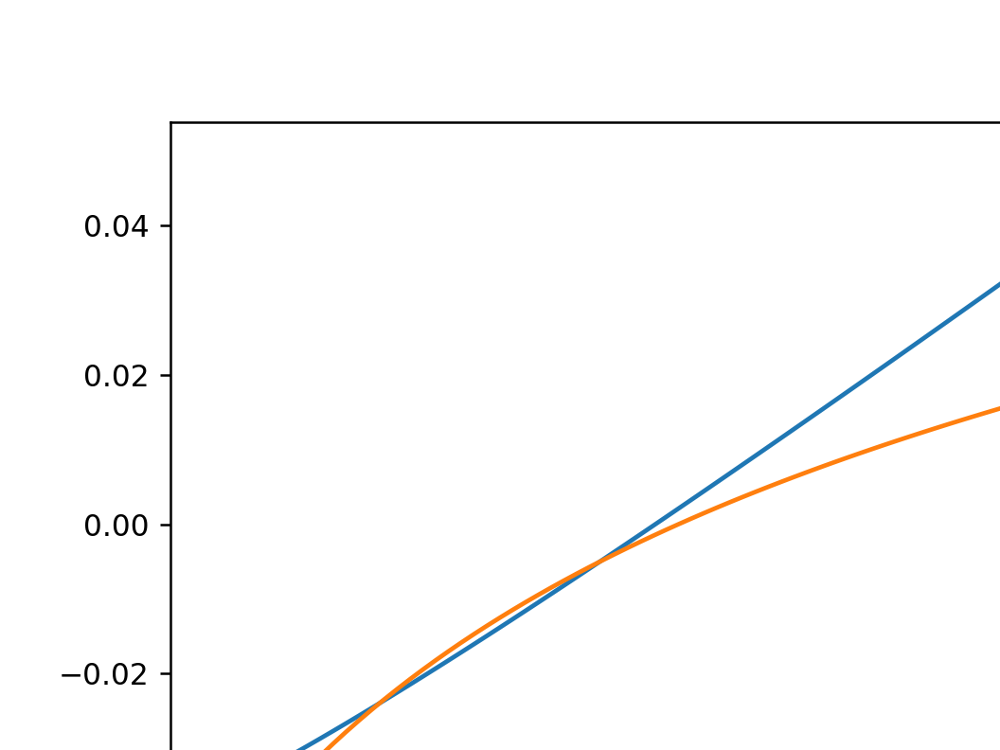

<IPython.core.display.Javascript object>


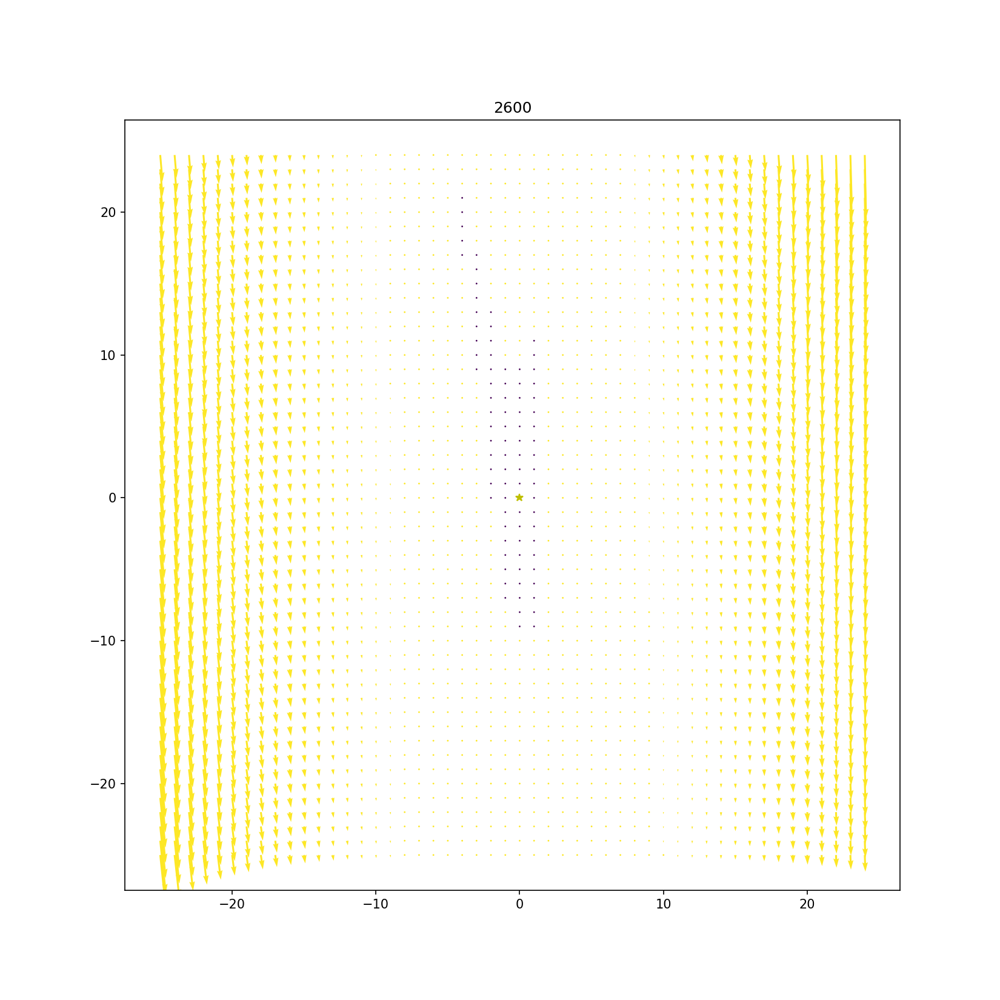

<IPython.core.display.Javascript object>


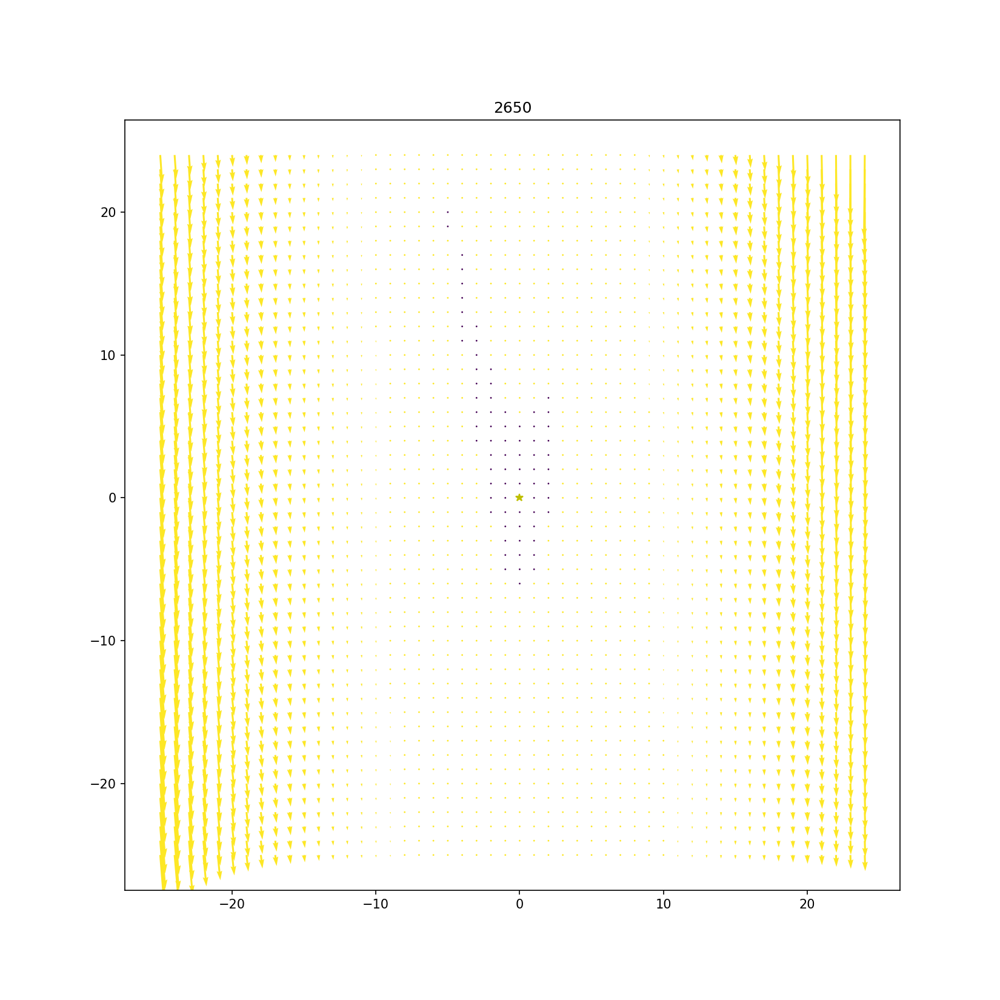

<IPython.core.display.Javascript object>


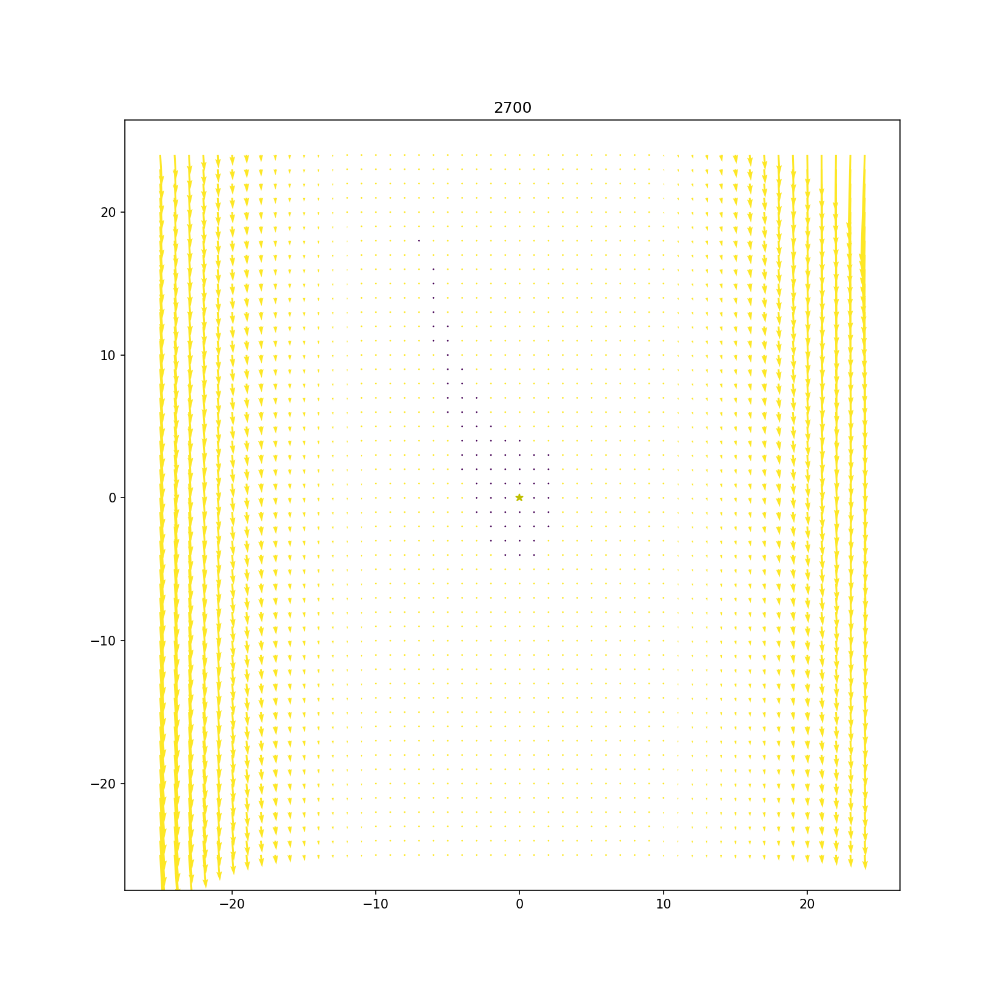

<IPython.core.display.Javascript object>


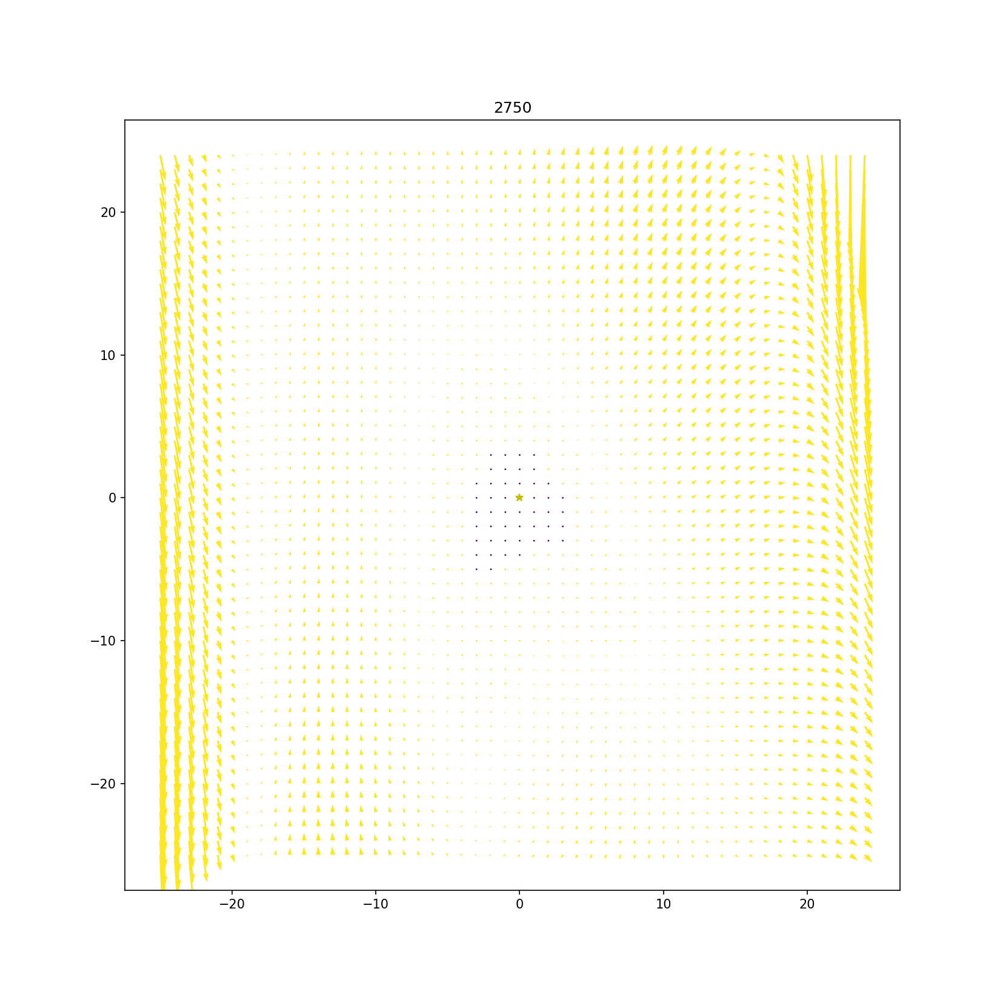

<IPython.core.display.Javascript object>


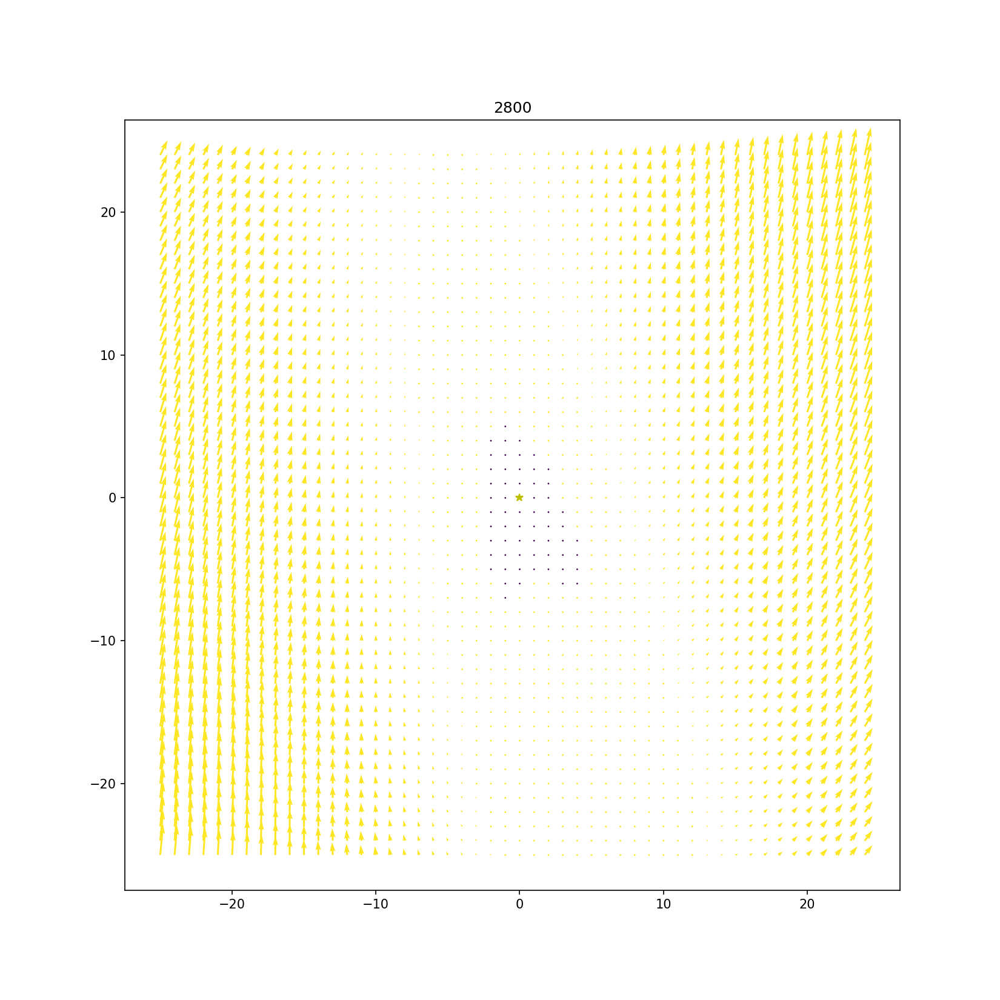

<IPython.core.display.Javascript object>


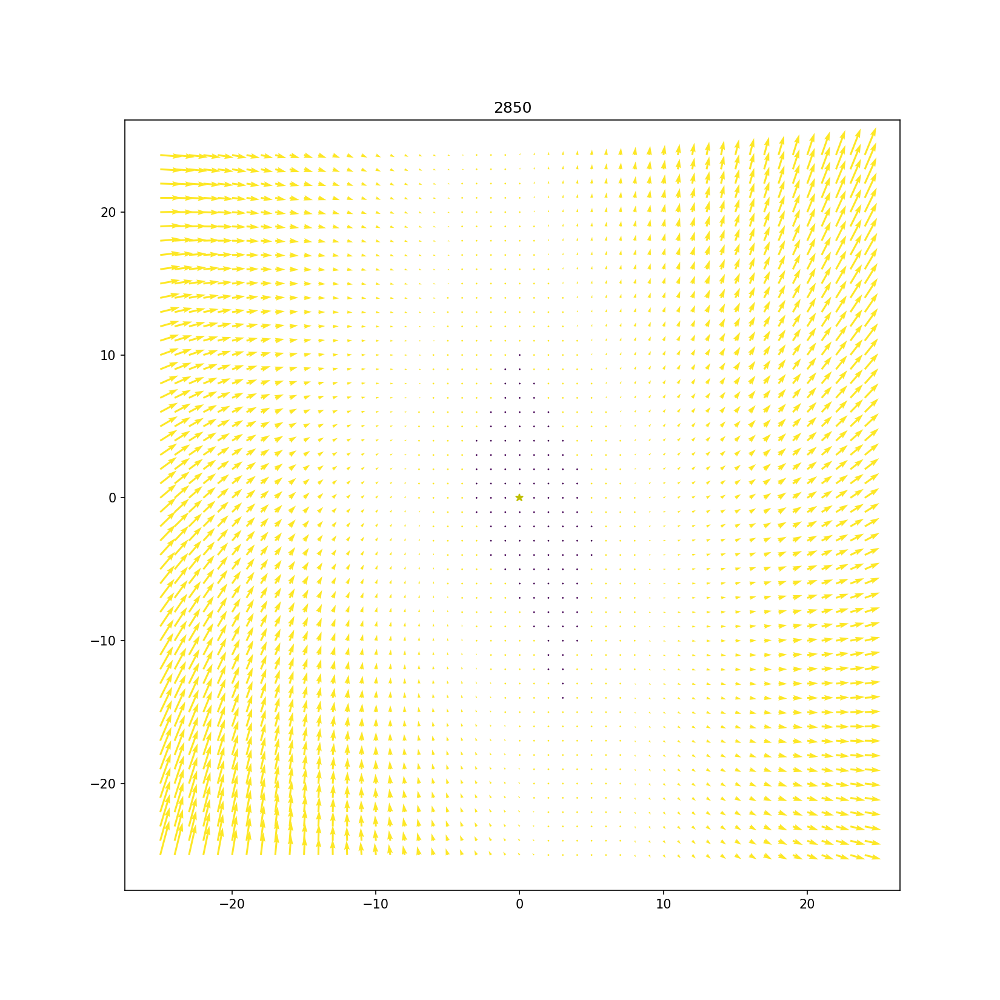

<IPython.core.display.Javascript object>


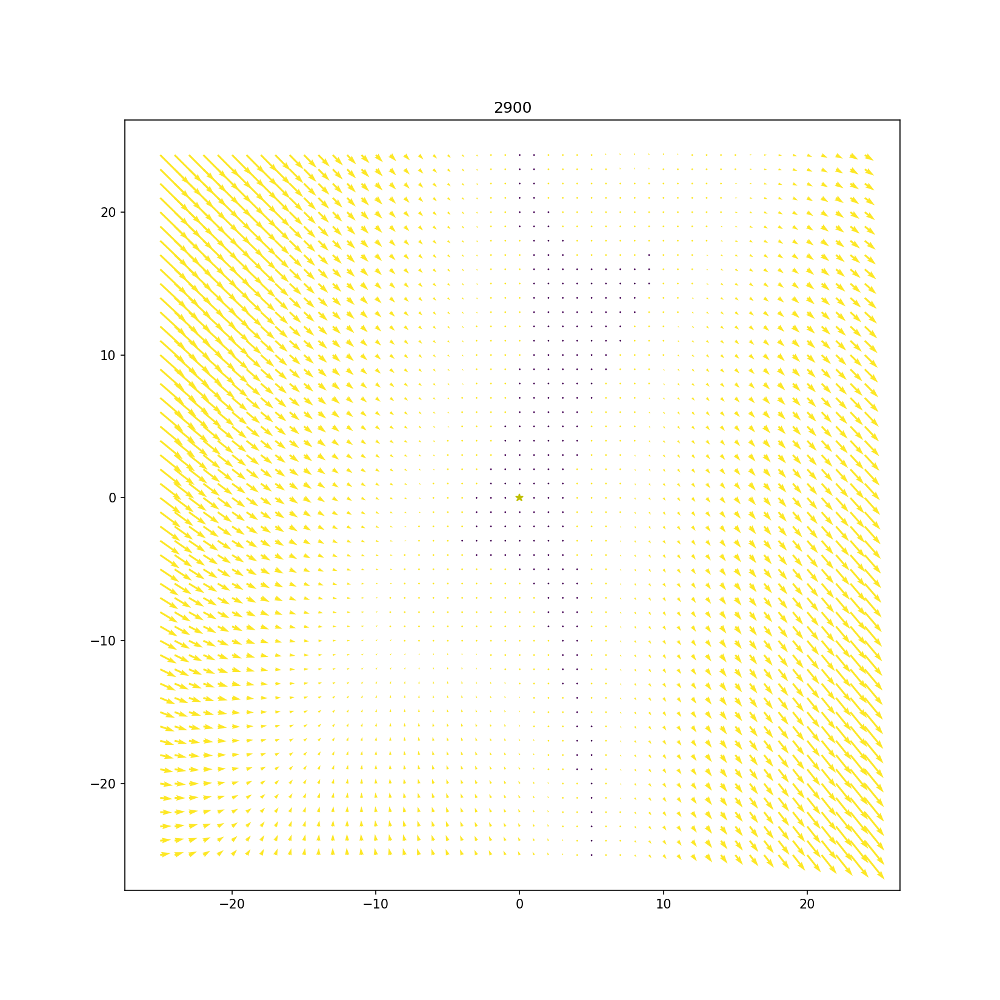

In [18]:
 for i in range(2600,2950,50):
    context = False
    diff = True
    Ki = 1.0
    fi = lambda x: pop_20_ode(x,0,K=Ki)
    dsi = fi(X[i])
    allRotsi = rotation_manager.get_rot(dsi)
    pi = perp_plane(X[i],allRotsi,delta = 0.01,N=M)
    g_in_fi = np.apply_along_axis(fi,0,pi)
    gstuffi = np.einsum('ij,jkl->ikl',allRotsi,g_in_fi)[1:]
    if context:
        fig = plt.figure(figsize=[11,11])
        ax = plt.axes(projection='3d')
        ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
        ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
        ax.plot3D(X[i,2], X[i,0], X[i,1], 'y*')
        ax.plot3D(p[i,2].flatten(), p[i,0].flatten(), p[i,1].flatten(), 'c.',ms=1)
        ax.set_xlabel('P')
        ax.set_ylabel('R')
        ax.set_zlabel('C')
        ax.set_xlim(1.2, 0)
        ax.set_ylim(1, 0)
    fig = plt.figure(figsize=[11,11])
    if diff:
        colo = np.sqrt((gstuffi[0]-gstuff[i][0])**2 + (gstuffi[1]-gstuff[i][1])**2) > .001
        plt.quiver(np.arange(-M//2,M//2),np.arange(-M//2,M//2),gstuffi[0]-gstuff[i][0],gstuffi[1]-gstuff[i][1],colo)
    else:
        colo = np.sqrt(gstuffi[0]**2 + gstuffi[1]**2) > .01
        plt.quiver(np.arange(-M//2,M//2),np.arange(-M//2,M//2),gstuffi[0],gstuffi[1],colo)
        plt.colorbar()
        #plt.quiver(gstuffi[0][15:35,15:35],gstuffi[1][15:35,15:35])
    plt.plot(0,0,'y*')
    plt.title(i)
    plt.show()

<IPython.core.display.Javascript object>


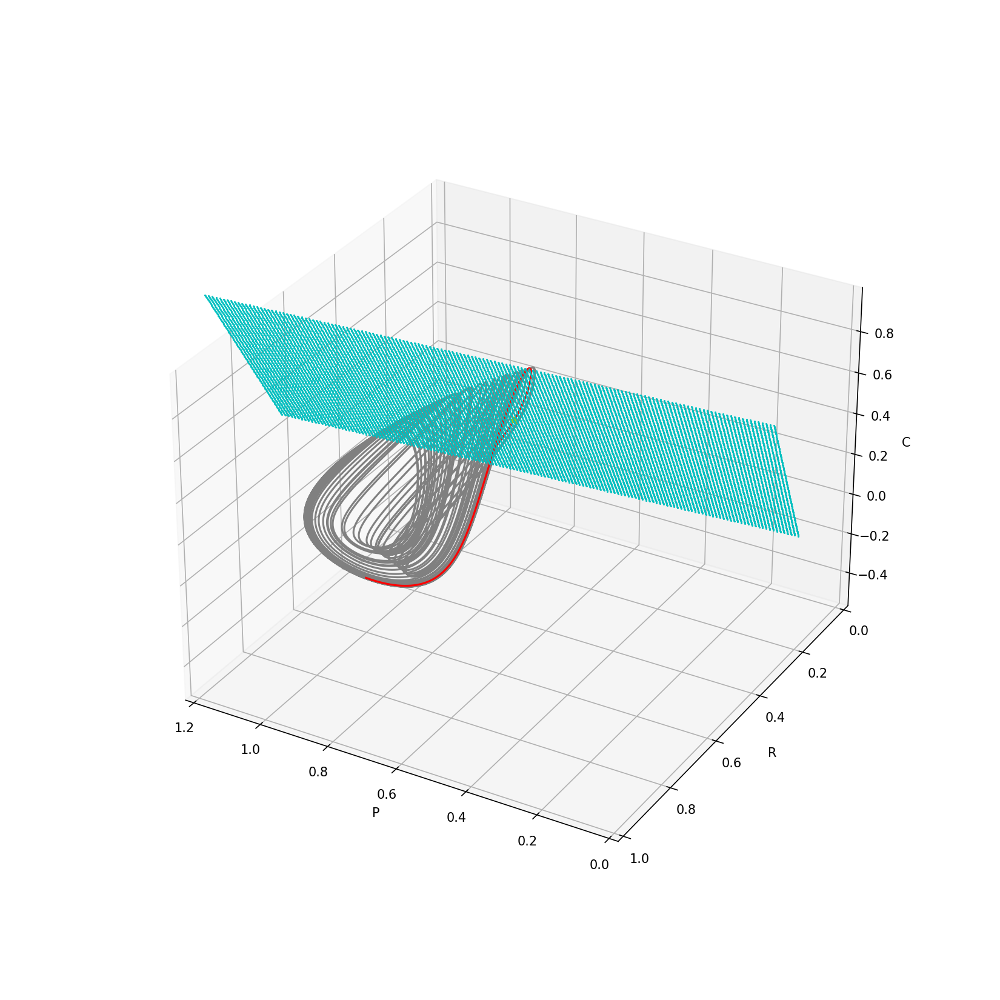

<IPython.core.display.Javascript object>


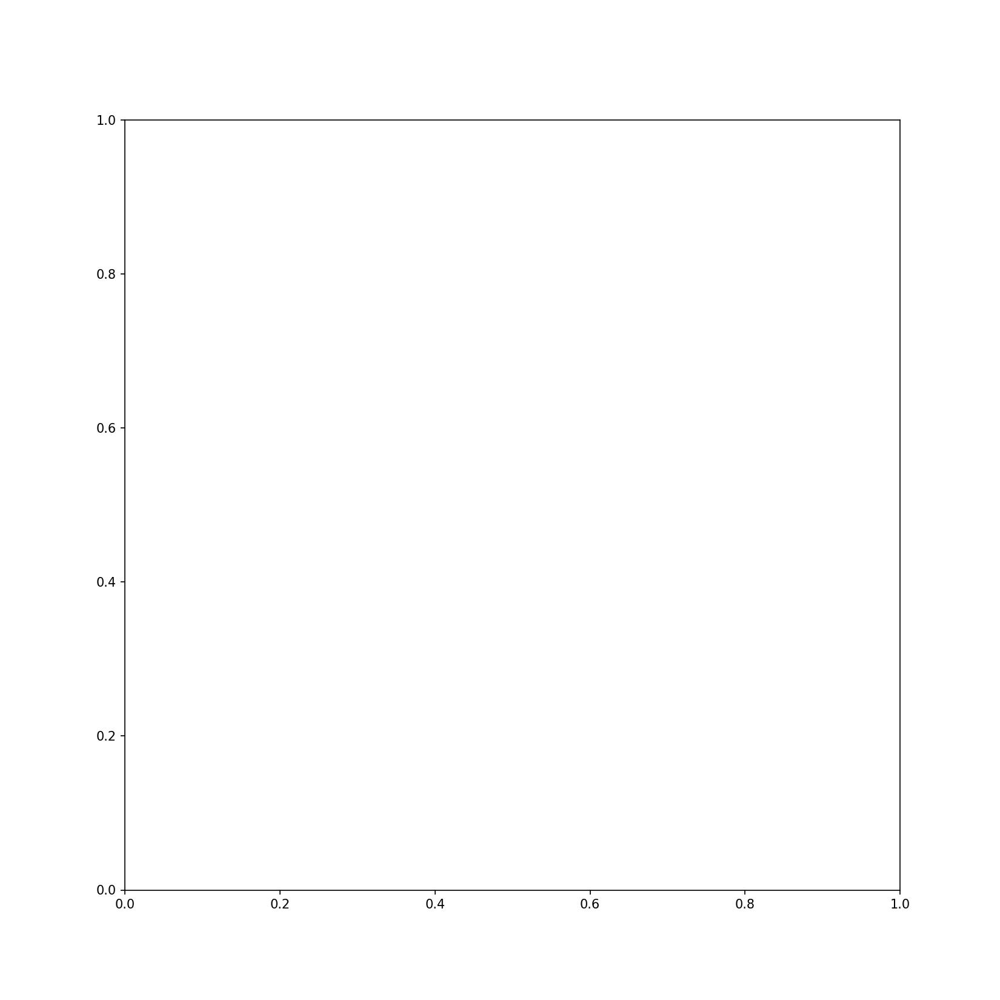

ValueError: Argument U has a size 2500 which does not match 150, the number of arrow positions

In [27]:
i = 2900
fig = plt.figure(figsize=[11,11])
ax = plt.axes(projection='3d')
ax.plot3D(xi[:,2], xi[:,0], xi[:,1], 'gray')
ax.plot3D(xi[-last:,2], xi[-last:,0], xi[-last:,1], 'red')
ax.plot3D(X[i,2], X[i,0], X[i,1], 'y*')
ax.plot3D(p[i,2].flatten(), p[i,0].flatten(), p[i,1].flatten(), 'c.',ms=1)
ax.set_xlabel('P')
ax.set_ylabel('R')
ax.set_zlabel('C')
ax.set_xlim(1.2, 0)
ax.set_ylim(1, 0)
fig = plt.figure(figsize=[11,11])
plt.quiver(np.arange(-M//2,M//2),np.arange(-M//2,M//2),gstuff[i][0],gstuff[i][1])
plt.plot(0,0,'y*')
plt.show()
fig = plt.figure(figsize=[11,11])
plt.quiver(np.arange(-M//2,M//2),np.arange(-M//2,M//2),gstuff2[i][0],gstuff2[i][1])
plt.plot(0,0,'y*')
plt.show()
fig = plt.figure(figsize=[11,11])
plt.quiver(np.arange(-M//2,M//2),np.arange(-M//2,M//2),gstuff2[i][0]-gstuff[i][0],gstuff2[i][1]-gstuff[i][1])
plt.plot(0,0,'y*')
plt.show()

In [ ]:
x0 = xi[-last,:]
t = np.arange(0, dt*last, dt)
f = lambda x: pop_20_ode(x,0,K=1.2)
Jf = lambda x: Jpop_20_ode(x,0,K=1.2)
T = last
states = spread*np.random.randn(num,N)+a0
def step(states):
    oldstates = np.copy(states)
    for j in range(substeps):
        states = rk_iter_nophi(dt,f,Jf,states)
    return states, np.mean(oldstates-states,axis=0)
def rk_iter_nophi(dt,f,Df,states):
    for i in range(len(states)):
        state = states[i]
        k1=dt*f(state)
        k2=dt*f(state+k1/2)
        k3=dt*f(state+k2/2)
        k4=dt*f(state+k3)
        states[i]=state+k1/6+k2/3+k3/3+k4/6
    return states
class rot_keeper(object):
    def __init__(self,d=3):
        assert(d>2)
        self.d=d
        self.e1 = np.zeros(d)
        self.e1[0]=1.0
        self.e1_sm = np.zeros(d-1)
        self.e1_sm[0]=1.0
        self.e2 = np.zeros(d)
        self.e2[1]=1.0
        self.R = np.eye(d)

    def get_rot(self,u):
        Rs = utils.rot_mat(u,self.e1)
        e2old = self.R.T@self.e2
        Rpp = np.eye(self.d)
        Rpp[1:,1:] = utils.rot_mat((Rs@e2old)[1:],self.e1_sm)
        Rs = Rpp @ Rs
        self.R = Rs
        return Rs


#initializing variables
X = xi[-last:]
RX = np.zeros((T,num,N))
rotation_manager = rot_keeper(d=N)
allRots = np.zeros((T,N,N))
allG = np.zeros((T,N-1,N-1))
allOmega = np.zeros((T,N))
gstuff2 = np.zeros((T,N-1,M,M))
p = np.zeros((T,N,M,M))

for i in range(last):
    #_, ds = step(X[i:i+1])
    ds = f(X[i])
    allRots[i] = rotation_manager.get_rot(ds)
    #RX[i] = (allRots[i]@(states-np.mean(states,axis=0)).T).T
    p[i] = perp_plane(X[i],allRots[i],delta = 0.01,N=M)
    g_in_f = np.apply_along_axis(f,0,p[i])
    gstuff2[i] = np.einsum('xij,jkl->ikl',allRots[i],g_in_f)[1:]
    #RX[i] = (allRots[i]@(states-states[0]).T).T
    
    #allOmega[i,:] = Phi[0,:]#/np.sqrt(np.sum(ds**2))
    #G = Phi[1:,1:]

    #allG[i,:,:] = G

In [63]:
def stuff(x):
    return np.array([x[0],x[2],x[1]])
np.apply_along_axis(stuff,0,p).shape

(3, 26, 26)

In [49]:
pnt=X[i][0]
rot=allRots[i]
delta=0.1
N=10
N = N//2
g=np.stack(np.meshgrid(np.arange(-N,-N),0,np.arange(-N,N))) #yes, the order is really, really weird. Thanks numpy
q = np.einsum('ij,jlkm->ilkm',rot.T,g) #transposed because we are going from g to f
#q = delta*q[:,0]+np.expand_dims(np.expand_dims(pnt,axis=1),axis=1) #dumping the flatness, shifting to the main point
g.shape

(3, 1, 0, 10)

In [53]:
np.meshgrid(np.arange(-N,N),0,np.arange(-N,N))

[array([[[-5, -5, -5, -5, -5, -5, -5, -5, -5, -5],
         [-4, -4, -4, -4, -4, -4, -4, -4, -4, -4],
         [-3, -3, -3, -3, -3, -3, -3, -3, -3, -3],
         [-2, -2, -2, -2, -2, -2, -2, -2, -2, -2],
         [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
         [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
         [ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1],
         [ 2,  2,  2,  2,  2,  2,  2,  2,  2,  2],
         [ 3,  3,  3,  3,  3,  3,  3,  3,  3,  3],
         [ 4,  4,  4,  4,  4,  4,  4,  4,  4,  4]]]),
 array([[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]]),
 array([[[-5, -4, -3, -2, -1,  0,  1,  2,  3,  4],
         [-5, -4, -3, -

(3, 2, 1, 2)

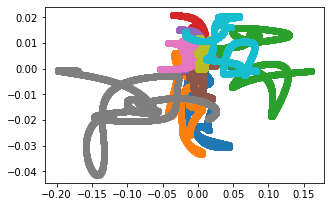

In [4]:
def pltN(x):
    N = x.shape[-1]
    plt.figure(figsize=[11,11])
    if len(x.shape)==2:
        for q in range(N-1):
            plt.subplot(N,q+1,1)
            plt.scatter(x[:,0],x[:,q+1],c='r')
    else:
        for q in range(N-1):
            for n in range(x.shape[1]):
                plt.subplot(N,q+1,1)
                plt.scatter(x[:,n,0],x[:,n,q+1])
    plt.show()
pltN(RX)

In [27]:
planex,planey = np.meshgrid(np.arange(-1,1,.01),np.arange(-1,1,.01))
n = 4500
R = allRots[n]
xs = np.expand_dims(np.expand_dims(X[n,0],1),1)+np.einsum('jk,jnm->knm',R[:,1:].T,np.stack([planex,planey],axis=0))
popt = lambda x: pop_20_ode(x,t)
dxs = np.zeros([3,200,200])
for q in range(xs.shape[1]):
    for w in range(xs.shape[2]):
        dxs[:,q,w]=popt(xs[:,q,w])
dxsr = np.einsum('jk,jnm->knm',R[:,:],dxs)

array([[[  0.11203013,   0.11249464,   0.11290587, ...,   0.17270782,
           0.17419268,   0.17569316],
        [  0.10876694,   0.10929634,   0.10976862, ...,   0.16899047,
           0.17046443,   0.17195402],
        [  0.10544255,   0.10604164,   0.10657946, ...,   0.16530857,
           0.16677169,   0.16825045],
        ...,
        [  0.59683092,   0.59332049,   0.58983436, ..., -21.53323528,
           5.37948274,   2.7378735 ],
        [  0.60238543,   0.59888366,   0.59540637, ...,  -2.09875207,
          -7.3723497 ,   8.72851026],
        [  0.60800499,   0.60451236,   0.60104439, ...,  -0.85692543,
          -1.64067098,  -4.31509695]],

       [[ -0.06120984,  -0.06050296,  -0.05977268, ...,  -0.76756294,
          -0.7771787 ,  -0.7868596 ],
        [ -0.06047657,  -0.0597841 ,  -0.05906318, ...,  -0.75193448,
          -0.76146076,  -0.77105217],
        [ -0.05974533,  -0.05907351,  -0.05836779, ...,  -0.73642339,
          -0.74586019,  -0.7553621 ],
        ...,


In [24]:
dx = np.array([pop_20_ode(xi, 1) for xi in x_train])

(3,)

In [37]:
dxs.shape

(3, 200, 200)